In [168]:
# Importing dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from statsmodels.tsa.arima.model import ARIMA as ARIMA
from mpl_toolkits.mplot3d import Axes3D
from statsmodels.nonparametric.smoothers_lowess import lowess
from datetime import datetime
import statsmodels.api as sm


In [169]:
data_interpolated = pd.read_csv('/Users/loveredin/Documents/GitHub/02427_advanced_time_series_analysis/02427_assignment_4/data/cex4WindDataInterpolated.csv')

test_split = np.where(data_interpolated['t'] == '2003-01-01 00:00:00')[0][0]
data_interpolated_test = data_interpolated.iloc[test_split : ] # Test data for model
data_interpolated = data_interpolated.iloc[ : test_split] # Training data
data_interpolated['tod'] = data_interpolated['t'].str.split().str[1].str.split(':').str[0].astype(int) / 24
data_interpolated


,t,toy,p,Ws1,Wd1,T1,Ws2,Wd2,T2,Ws3,Wd3,T3,tod
0,1999-01-01 03:00:00,0.125,1.267,4.9,135.0,275.8,4.9,135.0,275.8,4.9,135.0,275.8,0.125000
1,1999-01-01 04:00:00,0.167,1.515,5.0,126.9,275.8,5.0,126.9,275.8,5.0,126.9,275.8,0.166667
2,1999-01-01 05:00:00,0.208,1.915,5.9,135.7,275.5,5.9,135.7,275.5,5.9,135.7,275.5,0.208333
3,1999-01-01 06:00:00,0.250,1.613,5.3,146.6,275.0,5.3,146.6,275.0,5.3,146.6,275.0,0.250000
4,1999-01-01 07:00:00,0.292,1.776,6.1,117.4,274.5,5.9,130.2,274.8,5.9,130.2,274.8,0.291667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35056,2002-12-31 19:00:00,364.792,NaN,7.7,220.8,267.0,7.7,211.2,266.5,7.7,211.2,266.5,0.791667
35057,2002-12-31 20:00:00,364.833,NaN,8.5,223.1,267.1,8.5,223.1,267.1,8.7,216.6,266.4,0.833333
35058,2002-12-31 21:00:00,364.875,NaN,8.9,220.5,267.3,8.9,220.5,267.3,8.9,220.5,267.3,0.875000
35059,2002-12-31 22:00:00,364.917,NaN,8.9,219.6,267.6,8.9,219.6,267.6,8.9,219.6,267.6,0.916667


In [170]:
### Calculate abrupt changes to the model

def get_column_changes(data):
    for column in data.columns:
        if column.startswith('T') or column.startswith('Ws') or column.startswith('Wd') or column == 'p':            
            data[f'{column}_change'] = (data[column] - data[column].shift(1))
    data.dropna()
    return data

def get_volatility(data):
    for volatility_window in range(5, 30 + 1, 5):       
        data[f'p_vol_{volatility_window}'] = data['p'].pct_change().rolling(volatility_window).std()
    # data[f'p_vol_{volatility_window}']
    
    return data

data_interpolated = get_column_changes(data_interpolated)
data_interpolated = get_volatility(data_interpolated)
data_interpolated.iloc[-1]['p_vol_5']

/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/1573726372.py:12: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  data[f'p_vol_{volatility_window}'] = data['p'].pct_change().rolling(volatility_window).std()
/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/1573726372.py:12: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  data[f'p_vol_{volatility_window}'] = data['p'].pct_change().rolling(volatility_window).std()
/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/1573726372.py:12: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecate

np.float64(0.0)

RangeIndex(start=0, stop=35061, step=1)
Plotting column toy
Plotting column p
Plotting column Ws1
Plotting column Wd1
Plotting column T1
Plotting column Ws2
Plotting column Wd2
Plotting column T2
Plotting column Ws3
Plotting column Wd3
Plotting column T3
Plotting column tod
Plotting column p_change
Plotting column Ws1_change
Plotting column Wd1_change
Plotting column T1_change
Plotting column Ws2_change
Plotting column Wd2_change
Plotting column T2_change
Plotting column Ws3_change
Plotting column Wd3_change
Plotting column T3_change
Plotting column p_vol_5
Plotting column p_vol_10
Plotting column p_vol_15
Plotting column p_vol_20
Plotting column p_vol_25
Plotting column p_vol_30


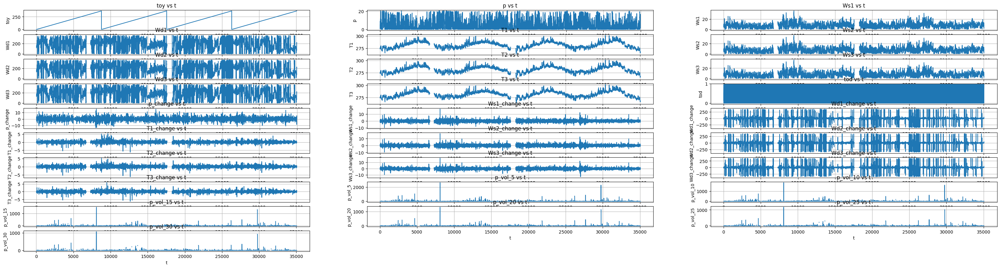

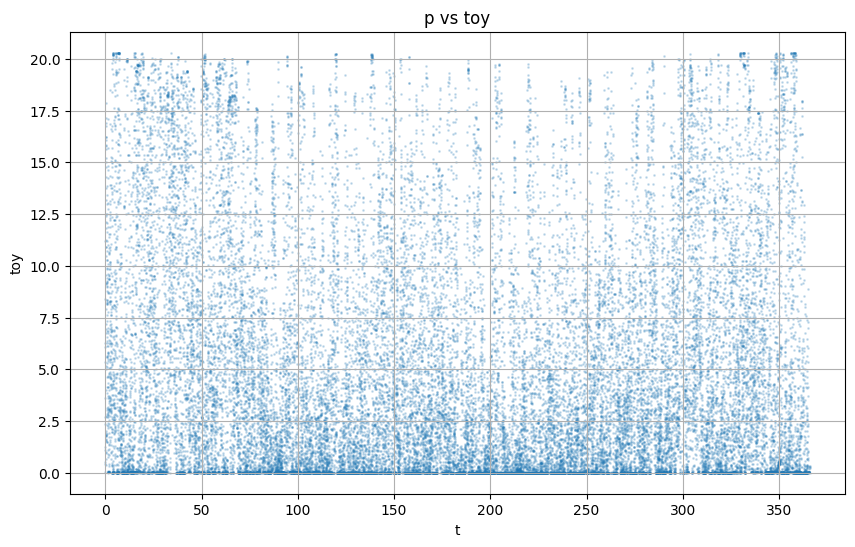

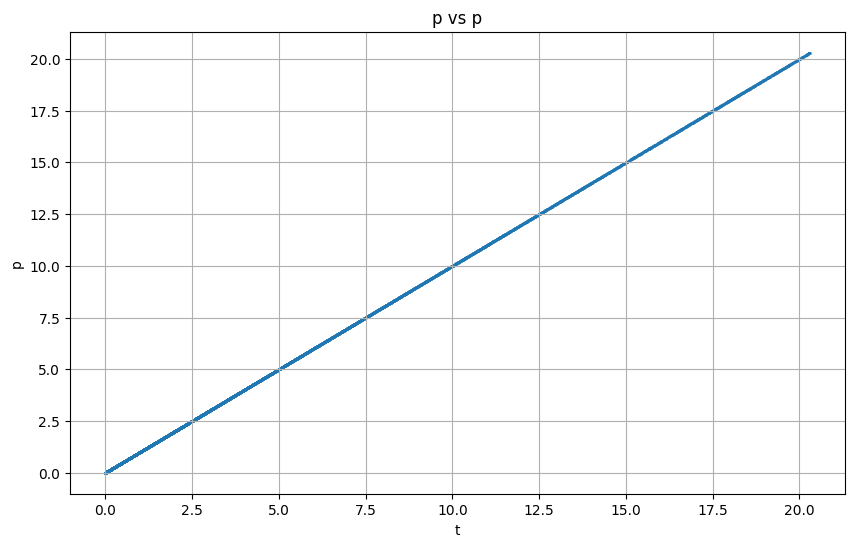

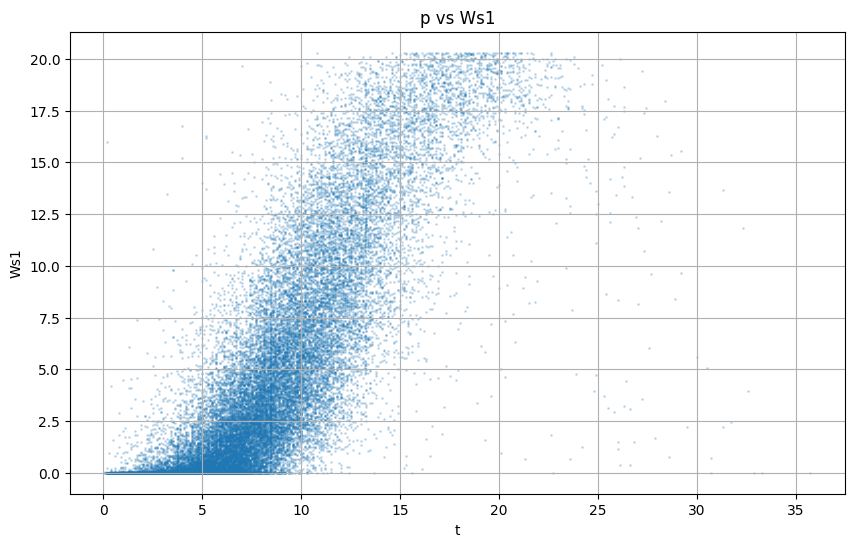

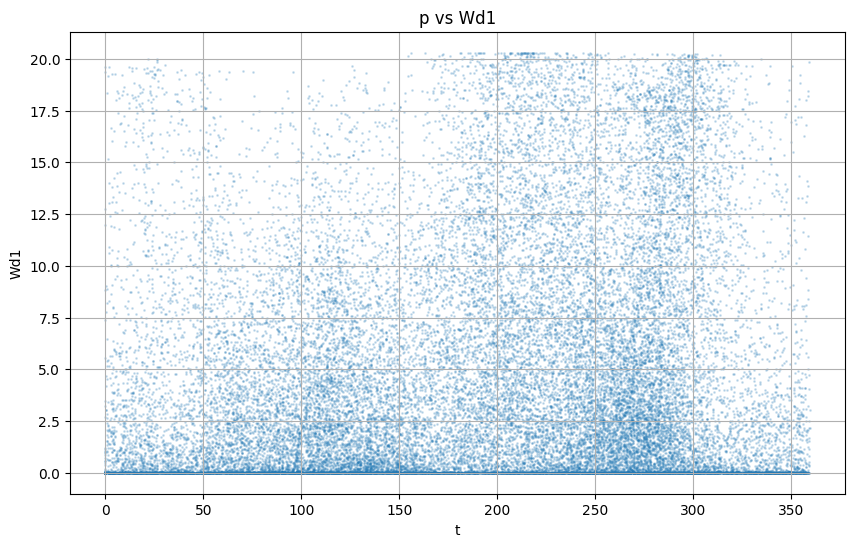

...

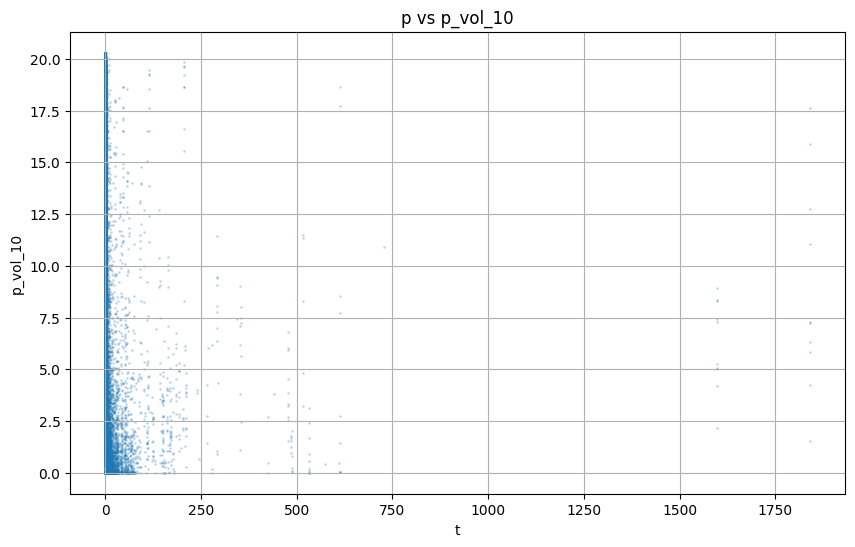

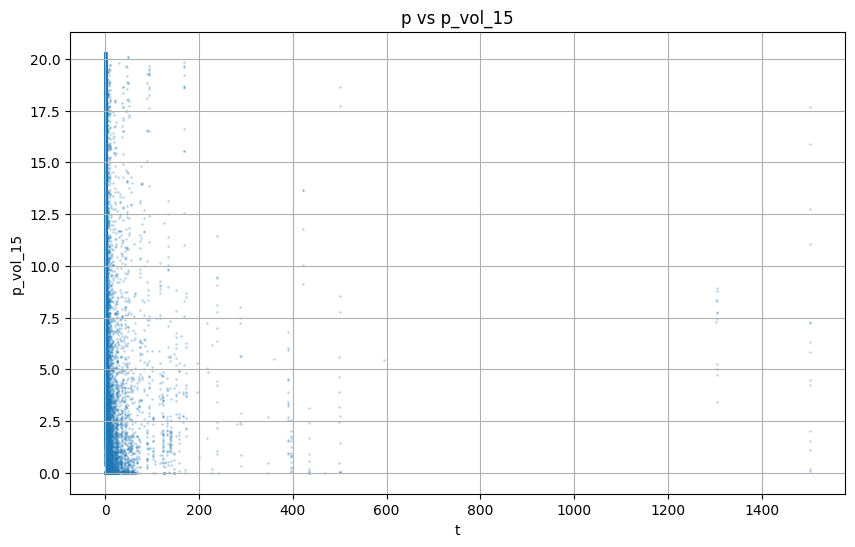

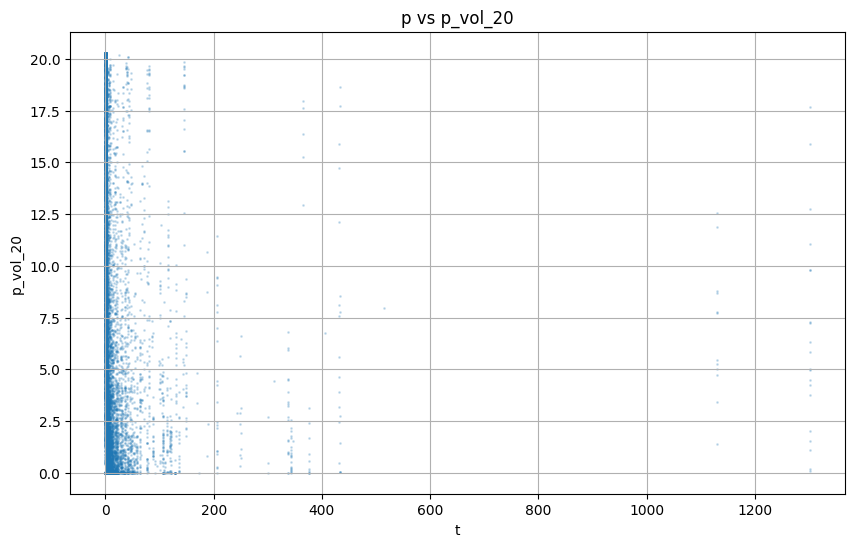

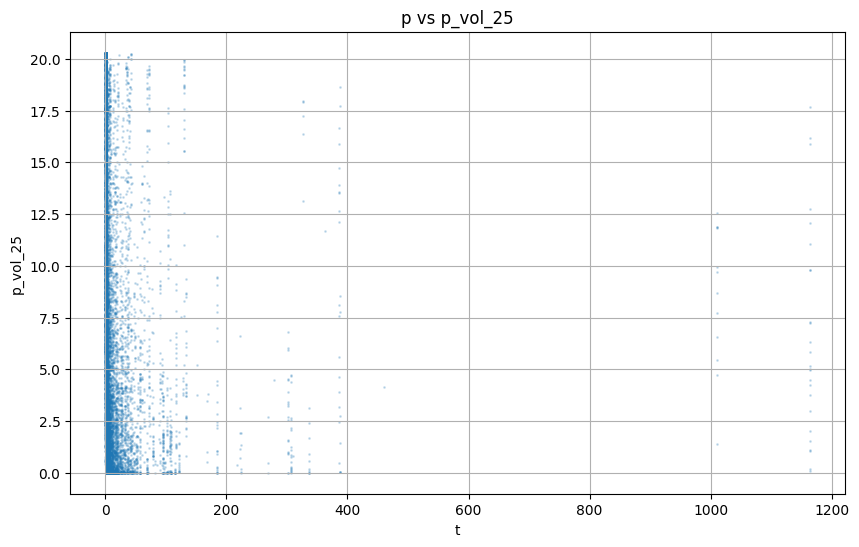

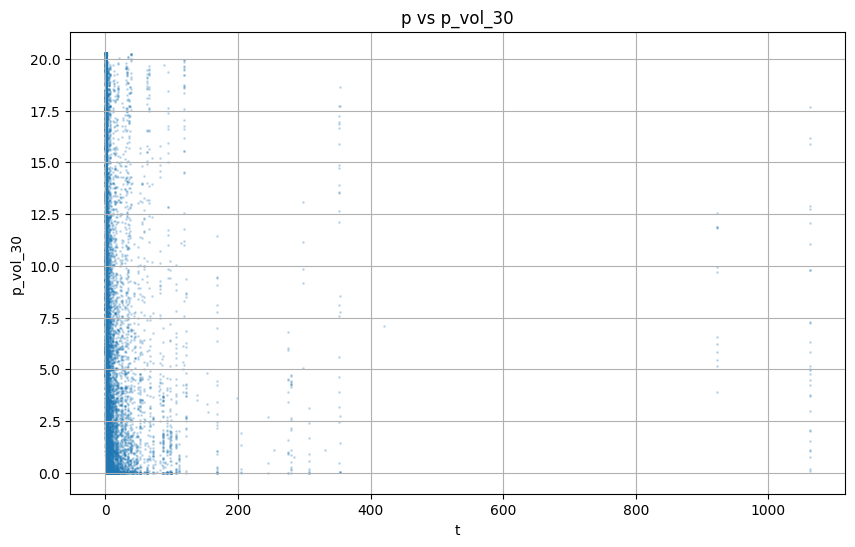

In [171]:
def plot_forecasts(data, nr_lags = 50):
    data_columns = data.columns[1: ]
    nr_columns = 3
    nr_rows = int(np.ceil(len(data_columns) / nr_columns))

    # Subplotting all variables as a function of time
    
    plt.figure(figsize = (40, 10))
    print(data.index)
    for col_idx, col in enumerate(data_columns):
        try:
            print(f'Plotting column {col}')
            plt.subplot(nr_rows, nr_columns, (col_idx + 1))
            plt.plot(data.index, data[col], label = f'{col}')
            plt.xlabel(f't')
            plt.ylabel(f'{col}')
            plt.title(f'{col} vs t')
            plt.grid('on')
        except:
            pass
    plt.show()

    # Subplotting p against all variable
    
    for col_idx, col in enumerate(data_columns):
        try:
            plt.figure(figsize = (10, 6))
            plt.scatter(data[col], data['p'], label = f'{col}', s = 1, alpha = 0.2)
            plt.xlabel(f't')
            plt.ylabel(f'{col}')
            plt.title(f'p vs {col}')
            plt.grid('on')
            plt.show()
        except:
            pass
    

    

plot_forecasts(data_interpolated)


## Interpretation of variables:

### The following columns can be observed in the data:

- t:  The time in UTC. This is the end point of the sample period, i.e. the values in the row of $t_i$ is the average between $t_i$ and $t_{i-1}$.

- toy: The time of year in days.

- p:  The measured average wind power.

- Ws1: The 1-hour ahead forecasted wind speed.

- Wd1: The 1-hour ahead forecasted wind direction.

- T1: The 1-hour ahead forecasted temperature.

- Ws2: The 2-hour ahead forecasted wind speed.

- Wd2: The 2-hour ahead forecasted wind direction.

- T2: The 2-hour ahead forecasted temperature.

- Ws3: The 3-hour ahead forecasted wind speed.

- Wd3: The 3-hour ahead forecasted wind direction.

- T3: The 3-hour ahead forecasted temperature.


### Part 1 - Estimation of the power curve;

- As a beginning it may be an idea to estimate the power curve, the dependence of the power production on the wind speed, for different wind directions.

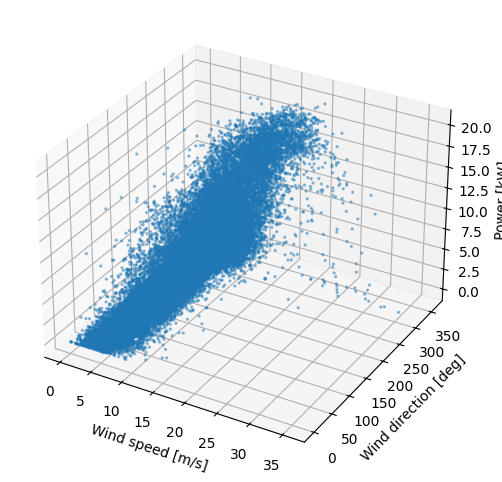

/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/270872648.py:29: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  surface = df.pivot_table(


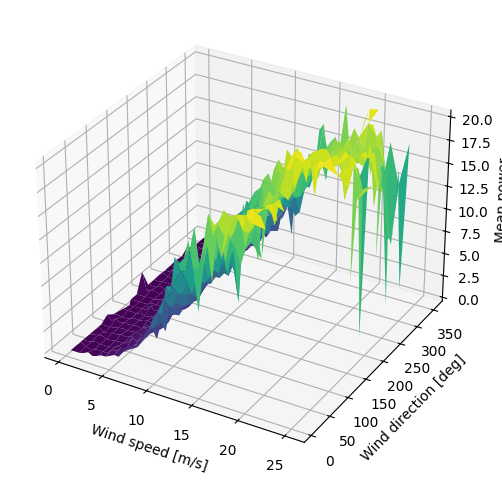

In [172]:
data = data_interpolated

def plot_power_curve(df):
    

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(
        df['Ws1'],
        df['Wd1'],
        df['p'],
        s=2,
        alpha=0.4
    )

    ax.set_xlabel('Wind speed [m/s]')
    ax.set_ylabel('Wind direction [deg]')
    ax.set_zlabel('Power [kW]')

    plt.show()


    v_bins = np.arange(0, 26, 0.5)
    d_bins = np.arange(0, 361, 15)
    df['v_bin'] = pd.cut(df['Ws1'], v_bins)
    df['d_bin'] = pd.cut(df['Wd1'], d_bins, right=False)

    surface = df.pivot_table(
        values='p',
        index='v_bin',
        columns='d_bin',
        aggfunc='mean'
    )
    v_centers = np.array([b.mid for b in surface.index])
    d_centers = np.array([b.mid for b in surface.columns])

    V, D = np.meshgrid(v_centers, d_centers, indexing='ij')
    P = surface.values
    fig = plt.figure(figsize=(9,6))
    ax = fig.add_subplot(111, projection='3d')

    ax.plot_surface(
        V, D, P,
        cmap='viridis',
        linewidth=0,
        antialiased=True
    )

    ax.set_xlabel('Wind speed [m/s]')
    ax.set_ylabel('Wind direction [deg]')
    ax.set_zlabel('Mean power')

    plt.show()



plot_power_curve(data)


### 2D kernel of the surface

/Users/loveredin/Documents/GitHub/02427_advanced_time_series_analysis/.venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:571: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/Users/loveredin/Documents/GitHub/02427_advanced_time_series_analysis/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


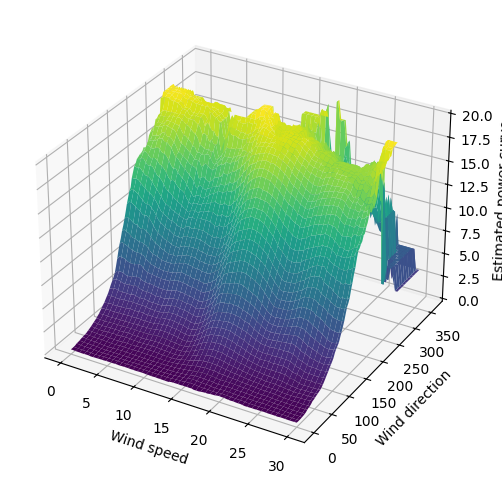

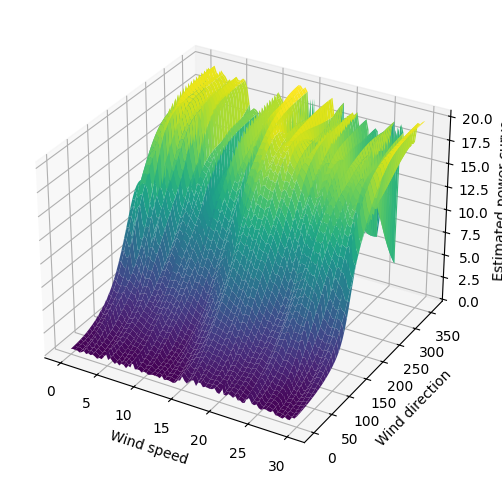

In [173]:
def kernel(wind_speed_predictor, wind_direction_predictor, data, angle_bin_width = 2, wind_speed_bin_width = 0.2, wind_speed_column = 'Ws1', wind_direction_column = 'Wd1', power_column = 'p'):
    indices = np.where((np.abs(data[wind_speed_column] - wind_speed_predictor) < wind_speed_bin_width) & (np.abs(data[wind_direction_column] - wind_direction_predictor) < angle_bin_width))
    kernel_average = np.average(data.iloc[indices][power_column].dropna())
    return kernel_average

    # Implement gaussian kernel in R script, where the power curve is modelled by the distance between point, the weight is assigned by normalized gaussian distance, see slides

def gaussian_kernel(data, w_s, w_d, wind_speed_slope = 10, wind_direction_slope = 10, wind_speed_column = 'Ws1', wind_direction_column = 'Wd1'):
    """
    gaussian_sum = 0
    regression_sum = 0
    for _, point in data.iterrows():
        kernel_weight = np.exp(-wind_speed_slope * (w_s - point['Ws1']) ** 2 - wind_speed_slope * (w_d - point['Wd1']) ** 2)
        regression_sum += point['p'] * kernel_weight
        gaussian_sum += kernel_weight
    return regression_sum / gaussian_sum
    """
    data_dropped_na = data.dropna()
    ws = data_dropped_na[wind_speed_column].to_numpy()
    wd = data_dropped_na[wind_direction_column].to_numpy()
    p  = data_dropped_na['p'].to_numpy()
    

    w = np.exp(-wind_speed_slope*(w_s - ws)**2 - wind_direction_slope*(w_d - wd)**2)
    return (w @ p) / (w.sum())

    

def plot_kernel(data, angle_bin_width = 2, wind_speed_bin_width = 0.2, kernel_function = 'kernel', gaussian_wind_speed_weight = 0.01, gaussian_wind_direction_weight = 0.1, wind_speed_column = 'Ws1', wind_direction_column = 'Wd1'):
    wind_speed_interval, wind_direction_interval = np.linspace(0, 30, 100), np.linspace(0, 360, 100)
    power_curve = np.zeros((len(wind_speed_interval), len(wind_direction_interval)))
    for w_s_index, w_s in enumerate(wind_speed_interval):
        for w_d_index, w_d in enumerate(wind_direction_interval):
            if kernel_function == 'kernel':
                power_curve[w_s_index][w_d_index] = kernel(w_s, w_d, data, angle_bin_width, wind_speed_bin_width, wind_speed_column = wind_speed_column, wind_direction_column = wind_direction_column)
            elif kernel_function == 'gaussian':
                power_curve[w_s_index][w_d_index] = gaussian_kernel(data, w_s, w_d, wind_speed_slope=gaussian_wind_speed_weight, wind_direction_slope=gaussian_wind_direction_weight, wind_speed_column = wind_speed_column, wind_direction_column = wind_direction_column)
    
    W_s, W_d = np.meshgrid(wind_speed_interval, wind_direction_interval)

    # Plot the power curve
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(W_s, W_d, power_curve, cmap='viridis')
    ax.set_xlabel('Wind speed')
    ax.set_ylabel('Wind direction')
    ax.set_zlabel('Estimated power curve')
    plt.show()


wind_speed_column, wind_direction_column = 'Ws1', 'Wd1' 

plot_kernel(data, angle_bin_width=20, wind_speed_bin_width=3, wind_speed_column = wind_speed_column, wind_direction_column = wind_direction_column)

# Gaussian kernel
plot_kernel(data, kernel_function='gaussian', gaussian_wind_speed_weight=0.1, gaussian_wind_direction_weight=0.5, wind_speed_column = wind_speed_column, wind_direction_column = wind_direction_column)


## Gaussian kernel

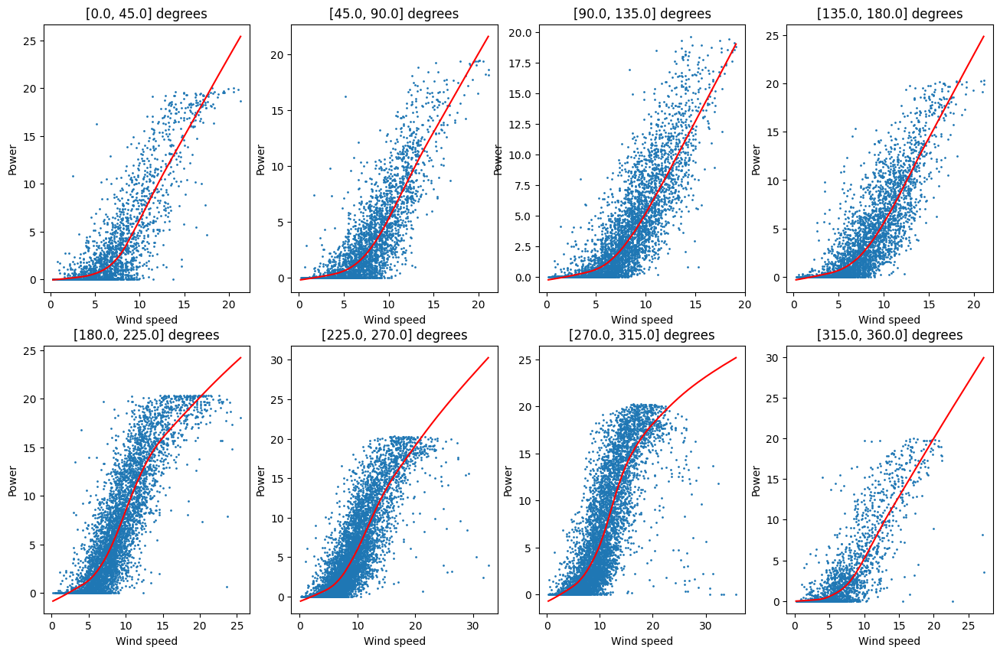

In [174]:
def estimate_and_plot_power_curve(data, nr_directions = 8, wind_speed_column = 'Ws1', wind_direction_column = 'Wd1', power_column = 'p'):
    # Estimation of power curve
    interval_length = 360 / nr_directions
    nr_rows = 2
    nr_columns = int(nr_directions / nr_rows)
    plt.figure(figsize=(16, 10))
    for direction in range(nr_directions):
        angle_interval = [direction * interval_length, (direction + 1) * interval_length]
        direction_data = data[(data[wind_direction_column] < angle_interval[1]) & (data[wind_direction_column] > angle_interval[0])]
        power_curve = lowess(direction_data[power_column], direction_data[wind_speed_column], frac = 0.5)
        wind_speed_interval, power_curve_prediction = power_curve.T[0], power_curve.T[1]
        plt.subplot(nr_rows, nr_columns, (direction + 1))
        plt.scatter(direction_data[wind_speed_column], direction_data[power_column], s = 1)
        plt.plot(wind_speed_interval, power_curve_prediction, color = 'red', label = 'Local regression estimate')
        plt.title(f'{angle_interval} degrees')
        plt.xlabel('Wind speed')
        plt.ylabel('Power')
    plt.show()

estimate_and_plot_power_curve(data)

[np.float64(1.0), np.float64(0.9398215448083127), np.float64(0.8670611990204288), np.float64(0.7992946834512733), np.float64(0.7330354443179408), np.float64(0.671758989679961), np.float64(0.6150530950495865), np.float64(0.5631104508211543), np.float64(0.5165008077002398), np.float64(0.4740646475032073), np.float64(0.435802362046039), np.float64(0.4010971562286621), np.float64(0.3708726533537399), np.float64(0.34487178146791664), np.float64(0.32213582126327733), np.float64(0.30345645380351766), np.float64(0.28670824310811743), np.float64(0.27087158790309585), np.float64(0.2580778053342824), np.float64(0.24872656327598253), np.float64(0.2410136974907731), np.float64(0.2338858279451428), np.float64(0.2269199845722297), np.float64(0.21824008285708105), np.float64(0.2075620851306463), np.float64(0.19647718174974257), np.float64(0.18527883436240106), np.float64(0.17364738325997534), np.float64(0.16220954835666812), np.float64(0.15318711036858604), np.float64(0.14541505609849648), np.float64(

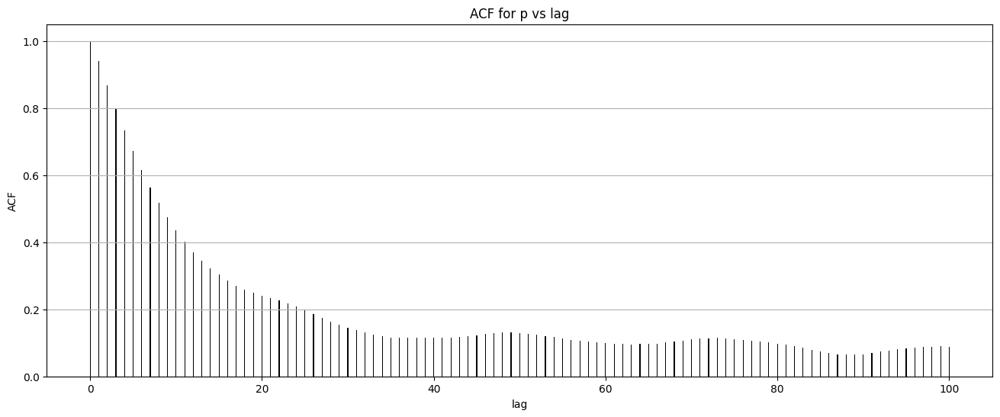

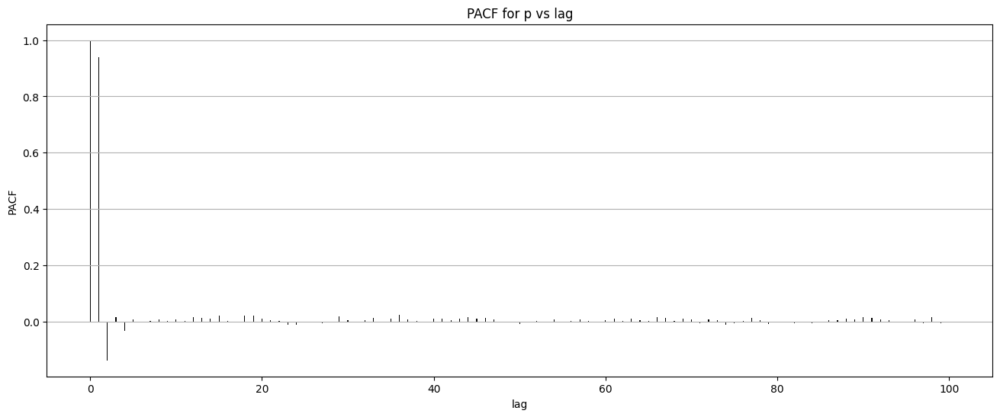

In [175]:
def calculate_and_plot_acf_and_pacf(data, max_lag, target_column = 'p', bar_width = 0.1):

    data_dropped_na = data.dropna()
    p = np.asarray(data_dropped_na[target_column])
    
    p0 = p - p.mean()
    n = len(p0)
    var = np.sum(p0**2) / n
    acf_values = []
    lags = [lag for lag in range(max_lag + 1)]
    for lag in range(max_lag + 1):
        acf_values.append(data_dropped_na[target_column].autocorr(lag=lag))  
    
    print(acf_values)

    plt.figure(figsize=(16, 6))
    plt.bar(lags, acf_values, label = f'ACF values for {target_column}', color = 'black', width = bar_width)
    plt.title(f'ACF for {target_column} vs lag')
    plt.grid(axis = 'y')
    plt.xlabel('lag')
    plt.ylabel('ACF')
    plt.show()

    # PACF
    pacf_values = [1]

    for k in range(1, max_lag + 1):
        y = p0[k:]
        X = np.column_stack([p0[k-j:-j] for j in range(1, k+1)])
        beta, _, _, _ = np.linalg.lstsq(X, y, rcond = None)
        pacf_values.append(beta[-1])
    
    plt.figure(figsize=(16, 6))
    plt.bar(lags, pacf_values, label = f'PACF values for {target_column}', color = 'black', width = 0.1)
    plt.title(f'PACF for {target_column} vs lag')
    plt.grid(axis = 'y')
    plt.xlabel('lag')
    plt.ylabel('PACF')
    plt.show()

    return acf_values, pacf_values

acf_values, pacf_values = calculate_and_plot_acf_and_pacf(data, max_lag = 100)

### Insights

- Looks like the AR should be of 1 or 2, the partial autocorrelation function shows strong trend of lag 1, and somewhat of a negative direct correlation of trend 2

### Collecting seasonal autocorrelation/pacf

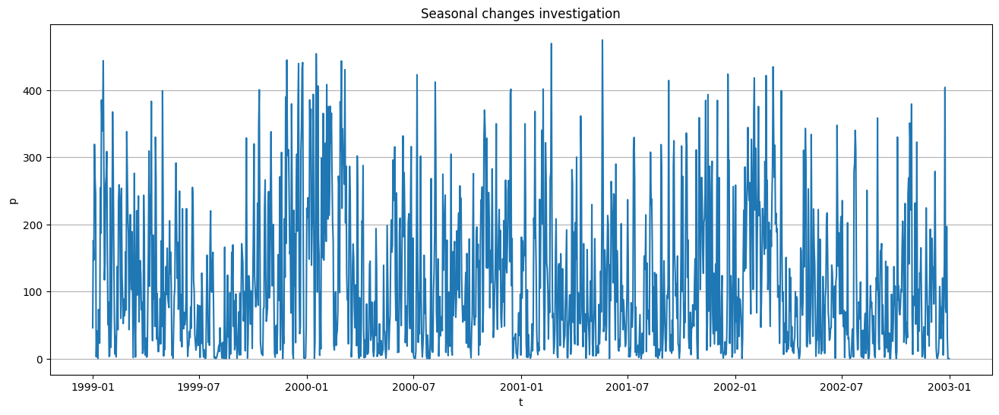

                p         toy
t                            
01-01  177.321438    0.494792
01-02  132.693813    1.479167
01-03  163.471000    2.479167
01-04  171.167250    3.479167
01-05  154.867250    4.479167
...           ...         ...
12-27   68.384750  360.729167
12-28   89.580750  361.729167
12-29   52.853750  362.729167
12-30   49.431000  363.729167
12-31   14.834000  364.729167

[366 rows x 2 columns]


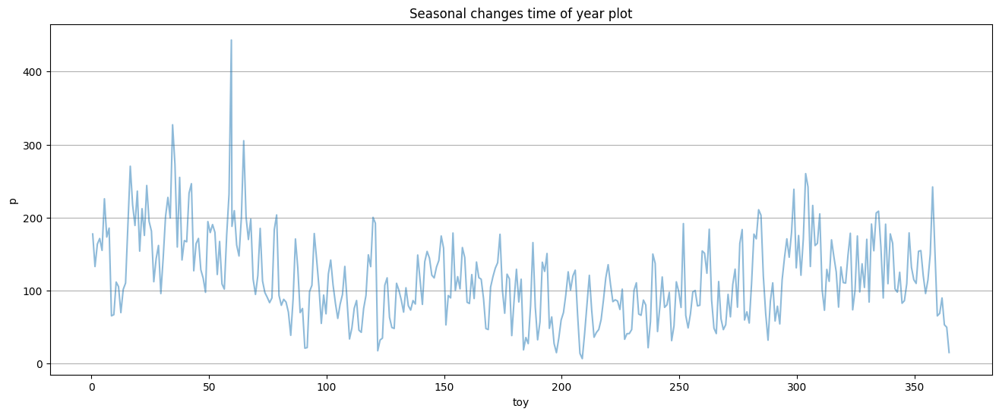

[np.float64(1.0), np.float64(0.480508262889008), np.float64(0.2394282709799049), np.float64(0.16428002550745466), np.float64(0.12494766660150043), np.float64(0.09922047410311506), np.float64(0.10656140992011193), np.float64(0.09980798801654195), np.float64(0.11318336405439565), np.float64(0.10698334501605102), np.float64(0.10868957159394975), np.float64(0.09959264856994532), np.float64(0.11012605349299827), np.float64(0.08306495138303917), np.float64(0.09596158791593208), np.float64(0.08447333903709353), np.float64(0.10848214024784497), np.float64(0.1029969326703241), np.float64(0.0897138497289178), np.float64(0.10513272061439193), np.float64(0.09566379165530534), np.float64(0.07194007398354504), np.float64(0.08108143051628572), np.float64(0.09653109284386584), np.float64(0.10398103560729442), np.float64(0.12093743363004257), np.float64(0.09835150978980231), np.float64(0.07626129749810683), np.float64(0.09243361521052995), np.float64(0.11042222448916826), np.float64(0.06634152110395435

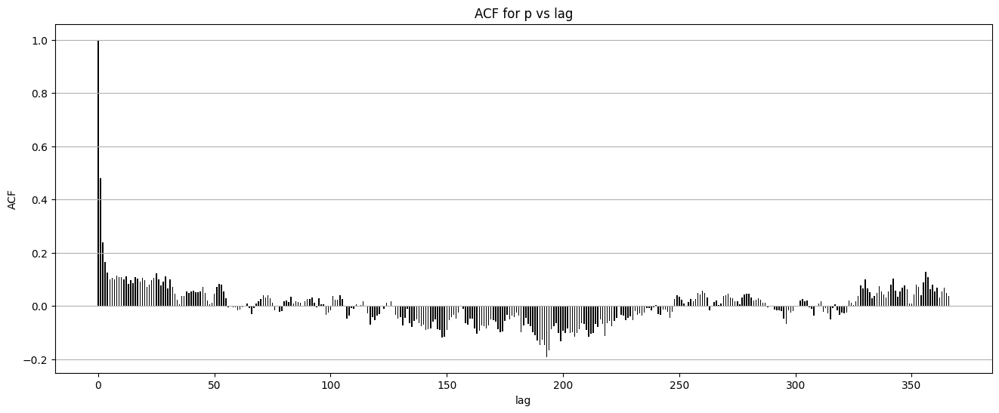

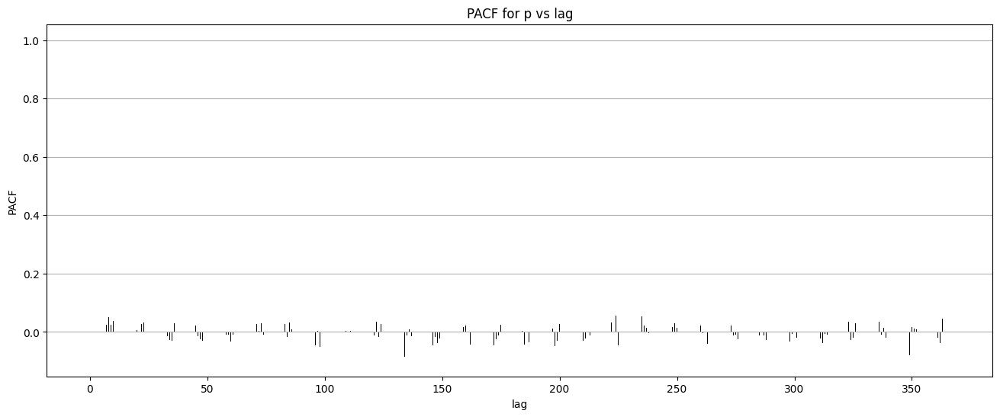

In [176]:
daily_aggregated_data = data[['p', 't', 'toy']].copy()
daily_aggregated_data["t"] = pd.to_datetime(daily_aggregated_data["t"])

groups = daily_aggregated_data.groupby(daily_aggregated_data["t"].dt.date)
daily_df = groups.agg({'p': 'sum', 'toy': 'mean'})
# Save back the daily aggregated data
daily_df.to_csv('/Users/loveredin/Documents/GitHub/02427_advanced_time_series_analysis/02427_assignment_4/data/cex4_daily_data.csv')

plt.figure(figsize = (16, 6))
plt.plot(daily_df.index, daily_df['p'], label = 'Daily averaged data')
plt.title(f'Seasonal changes investigation')
plt.xlabel('t')
plt.ylabel('p')
plt.grid(axis = 'y')
plt.show()

# lot of time of year, to this we want to fit a sinus curve
daily_df_sorted_on_toy = daily_df.sort_values(['toy'])
daily_df.index = pd.to_datetime(daily_df.index)
daily_df_sorted_on_toy = daily_df.sort_values(['toy'])
daily_mean = (daily_df_sorted_on_toy.groupby(daily_df_sorted_on_toy.index.strftime("%m-%d")).mean())
print(daily_mean)
plt.figure(figsize = (16, 6))
plt.plot(daily_mean['toy'], daily_mean['p'], label = 'Daily averaged data', alpha = 0.5)
plt.title(f'Seasonal changes time of year plot')
plt.xlabel('toy')
plt.ylabel('p')
plt.grid(axis = 'y')
plt.show()



daily_acf_values, daily_pacf_values = calculate_and_plot_acf_and_pacf(daily_df, max_lag = 366, bar_width=0.5)


### Kernel regressor to estimate power curve

### AR-part and correlations


                               SARIMAX Results                                
Dep. Variable:                      p   No. Observations:                35061
Model:                 ARIMA(1, 0, 2)   Log Likelihood              -66076.918
Date:                Mon, 15 Dec 2025   AIC                         132163.836
Time:                        21:06:58   BIC                         132206.160
Sample:                             0   HQIC                        132177.316
                              - 35061                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.9311      0.213     23.179      0.000       4.514       5.348
ar.L1          0.9400      0.002    402.206      0.000       0.935       0.945
ma.L1          0.1667      0.003     49.807      0.0

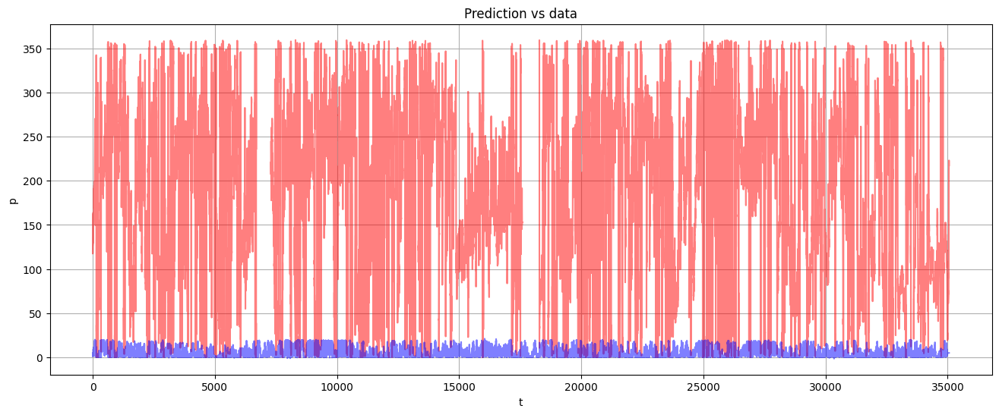

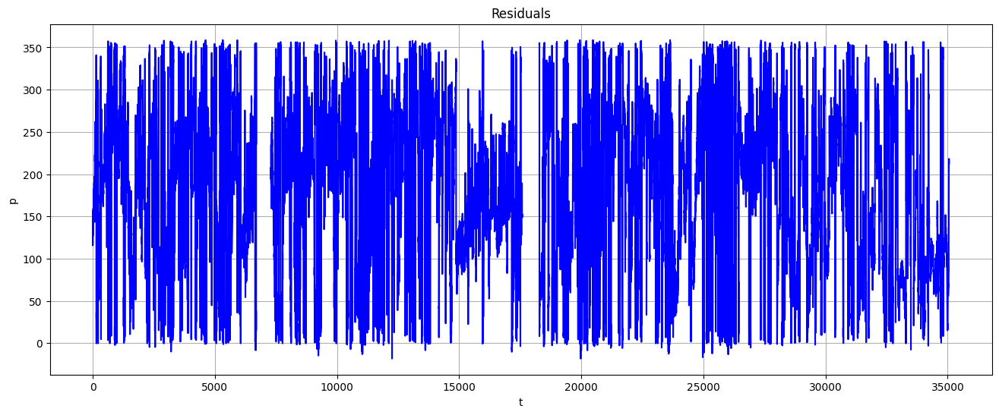

In [177]:
ar_level, ma_level = 1, 2
Wd1_ARIMA = ARIMA(data_interpolated['p'], order=(ar_level, 0, ma_level))
model_results = Wd1_ARIMA.fit()
print(model_results.summary())

prediction = model_results.predict()

plt.figure(figsize = (16, 6))
plt.plot(data_interpolated.index, data_interpolated['Wd1'], label = "data", color = "red", alpha = 0.5)
plt.plot(prediction, color = "blue", alpha = 0.5)
plt.title('Prediction vs data')
plt.xlabel(f't')
plt.ylabel(f'p')
plt.grid('on')
plt.show()

plt.figure(figsize = (16, 6))
plt.plot(data_interpolated.index, (data_interpolated['Wd1'] - prediction), label = "data", color = "blue")
plt.title('Residuals')
plt.xlabel(f't')
plt.ylabel(f'p')
plt.grid('on')
plt.show()

## Other ideas:

### Investing diurnal relationships

### Investing toy relationship

Plotting the time of the year against the wind speed

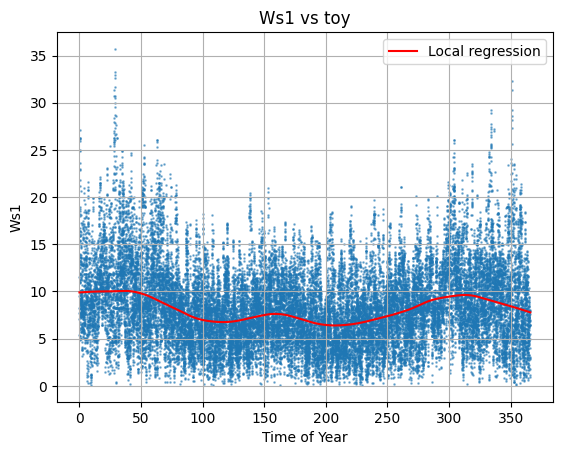

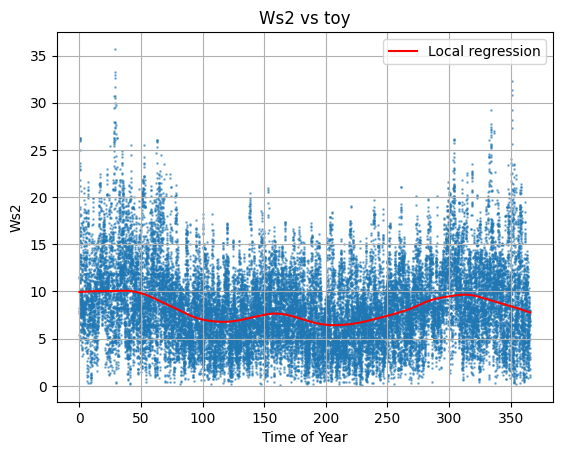

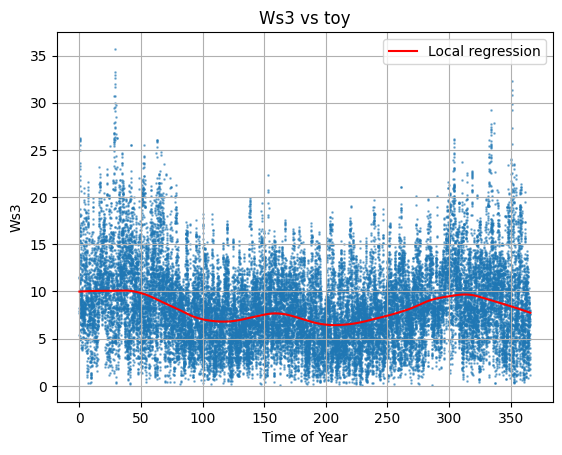

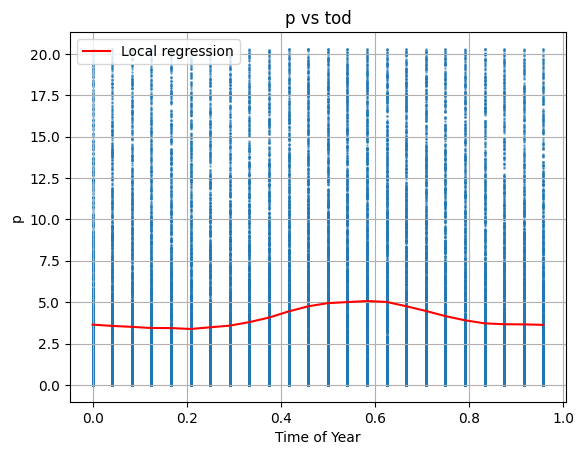

In [178]:
def plot_toy_wind_speed(data, column_start = 'Ws', regressor_column = 'toy', col_length = 3, frac = 0.2):
    for column in data:
        if column.startswith(column_start) and len(column) == col_length:
            wind_speed = lowess(data[column], data[regressor_column], frac = frac)
            time_of_year_interval, wind_speed_prediction = wind_speed.T[0], wind_speed.T[1]
            plt.figure()
            plt.scatter(data[regressor_column], data[column], s = 0.8, alpha = 0.5)
            plt.plot(time_of_year_interval, wind_speed_prediction, label = 'Local regression', color = 'red')
            plt.title(f'{column} vs {regressor_column}')
            plt.xlabel('Time of Year')
            plt.ylabel(f'{column}')
            plt.grid('on')
            plt.legend()
            plt.show()

plot_toy_wind_speed(data)
plot_toy_wind_speed(data_interpolated, column_start = 'p', regressor_column = 'tod', col_length = 1, frac = 0.06)

### Autoregressive model

- Autoregressive power
- Wind estimation?

In [179]:
# Re initializing the data
data = data_interpolated
data

,t,toy,p,Ws1,Wd1,T1,Ws2,Wd2,T2,Ws3,...,Wd3_change,T3_change,p_vol_5,p_vol_10,p_vol_15,p_vol_20,p_vol_25,p_vol_30,v_bin,d_bin
0,1999-01-01 03:00:00,0.125,1.267,4.9,135.0,275.8,4.9,135.0,275.8,4.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"(4.5, 5.0]","[135, 150)"
1,1999-01-01 04:00:00,0.167,1.515,5.0,126.9,275.8,5.0,126.9,275.8,5.0,...,-8.1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,"(4.5, 5.0]","[120, 135)"
2,1999-01-01 05:00:00,0.208,1.915,5.9,135.7,275.5,5.9,135.7,275.5,5.9,...,8.8,-0.3,NaN,NaN,NaN,NaN,NaN,NaN,"(5.5, 6.0]","[135, 150)"
3,1999-01-01 06:00:00,0.250,1.613,5.3,146.6,275.0,5.3,146.6,275.0,5.3,...,10.9,-0.5,NaN,NaN,NaN,NaN,NaN,NaN,"(5.0, 5.5]","[135, 150)"
4,1999-01-01 07:00:00,0.292,1.776,6.1,117.4,274.5,5.9,130.2,274.8,5.9,...,-16.4,-0.2,NaN,NaN,NaN,NaN,NaN,NaN,"(6.0, 6.5]","[105, 120)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35056,2002-12-31 19:00:00,364.792,NaN,7.7,220.8,267.0,7.7,211.2,266.5,7.7,...,-1.5,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,"(7.5, 8.0]","[210, 225)"
35057,2002-12-31 20:00:00,364.833,NaN,8.5,223.1,267.1,8.5,223.1,267.1,8.7,...,5.4,-0.1,0.0,0.0,0.0,0.0,0.0,0.0,"(8.0, 8.5]","[210, 225)"
35058,2002-12-31 21:00:00,364.875,NaN,8.9,220.5,267.3,8.9,220.5,267.3,8.9,...,3.9,0.9,0.0,0.0,0.0,0.0,0.0,0.0,"(8.5, 9.0]","[210, 225)"
35059,2002-12-31 22:00:00,364.917,NaN,8.9,219.6,267.6,8.9,219.6,267.6,8.9,...,-0.9,0.3,0.0,0.0,0.0,0.0,0.0,0.0,"(8.5, 9.0]","[210, 225)"


### Model

- This is the implementation of the extended Kalman filter to approximate parameters
- Change model for wind speed and direction, parametrize the curve

#### The following model will be constructed

$X_{t+1} = (AR)_1 X_{t} + \frac{max_p}{1 + e^{-\alpha(W_{s_1} - \beta)}} + \text{diurnal} + (a sin(k_1 t) + b cos(k_2 t)) + \epsilon_k = f(X_t, W_s) + \epsilon_t$

$Y_t = h(X_t, W_s) + \varepsilon_t  = X_t + \varepsilon_t$

$\begin{bmatrix}
p \\
\alpha \\
\beta \\
\text{max}_p
\end{bmatrix}$

## Starting simple, with only an autoregressive part

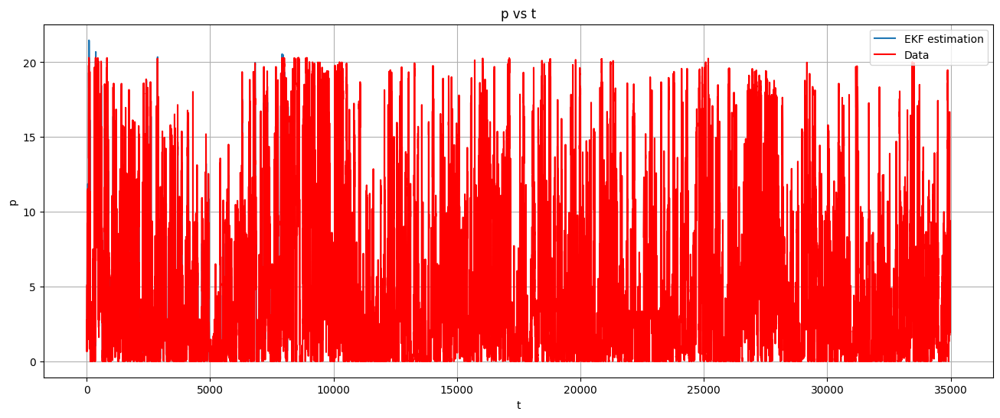

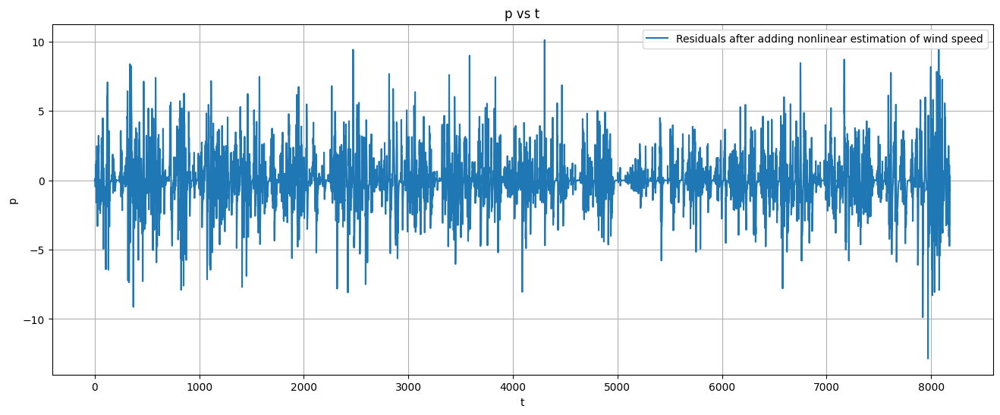

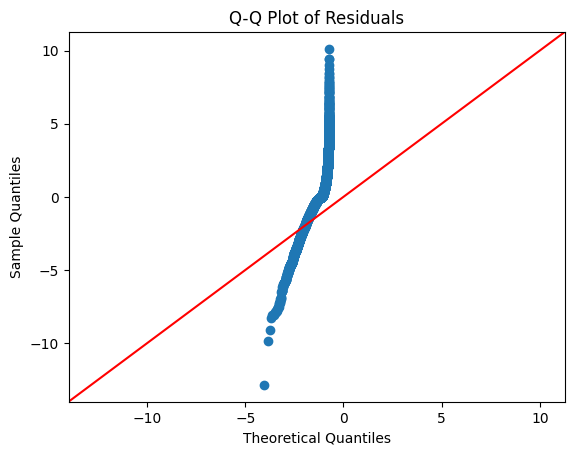

/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/1140631523.py:77: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


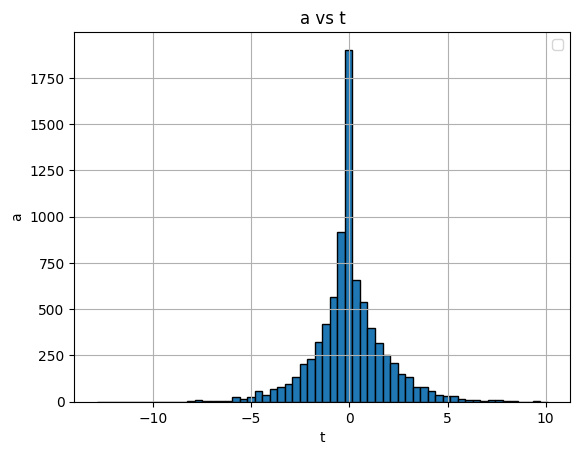

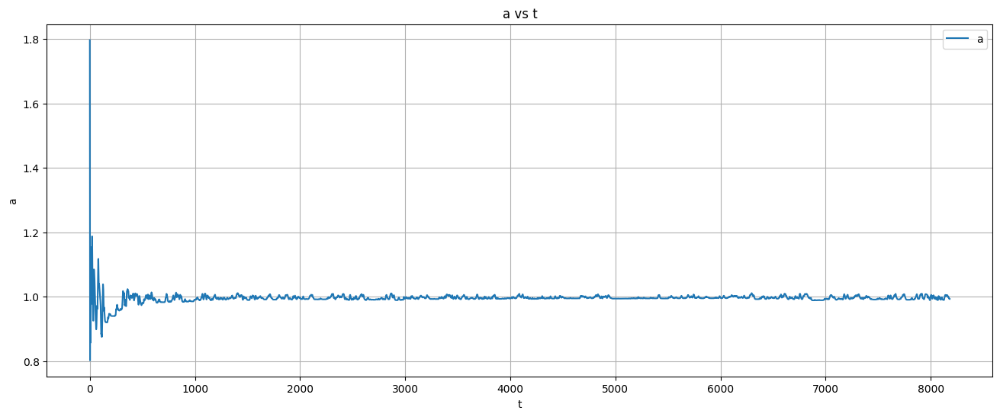

Final converged state (after 1000, before it goes to inf): [0.99028456]


In [180]:
def sigmoid(z):
    z = np.clip(z, -60, 60) # Irellevant?
    return 1.0/(1.0 + np.exp(-z))

def f(X, Ws, dt):
    p, a = X
    return np.array([a * p, a], dtype=float)

def F(X, Ws, dt):
    p, a = X
    J = np.eye(2)
    J[0,0] = a
    J[0,1] = 1
    return J

def h(X, Ws, dt):
    return np.array([X[0]], dtype=float)

def H(X, Ws, dt):
    return np.array([[1,0]], dtype=float)

def ekf(y, u, dt=1):
    R = np.array([[0.1]], dtype=float)
    X = np.array([y[0], 2.0], dtype=float)
    P = np.eye(len(X))*10.0
    Q = np.diag([1e-2, 1e-8])
    out = []
    for t in range(1, len(y)):
        Xp = f(X, u[t-1], dt)
        Fk = F(X, u[t-1], dt)
        Pp = Fk @ P @ Fk.T + Q
        yp = h(Xp, u[t-1], dt) # u[t-1] or u[t]?
        Hk = H(Xp, u[t-1], dt)
        r = np.array([y[t]], dtype=float) - yp
        S = Hk @ Pp @ Hk.T + R
        K = Pp @ Hk.T @ np.linalg.inv(S)
        X = Xp + (K @ r).reshape(-1)
        P = (np.eye(len(X)) - K @ Hk) @ Pp
        out.append(X.copy())
    return np.array(out)

X_t = ekf(y = data['p'].values, u = data['Ws1'].values)


t = [t for t in range(len(X_t[:, 0]))]

# Plot parameter estimated 
plt.figure(figsize=(16, 6))
plt.plot(t, X_t[:, 0], label='EKF estimation')
plt.plot(t, data['p'].values[1 : ], label = 'Data', color = 'red')
plt.legend()
plt.xlabel('t')
plt.ylabel('p')
plt.title('p vs t')
plt.grid('on')
plt.show()

# Plot residuals
residuals = (data['p'].values[1 : ] - X_t[:, 0])
plt.figure(figsize=(16, 6))
plt.plot(t, residuals, label='Residuals after adding nonlinear estimation of wind speed')
plt.legend()
plt.xlabel('t')
plt.ylabel('p')
plt.title('p vs t')
plt.grid('on')
plt.show()

# Q-Q plot of residuals
sm.qqplot(residuals, line='45')
plt.title("Q-Q Plot of Residuals")
plt.show()

# Histogram of residuals
plt.figure()
plt.hist(residuals, bins = 60, edgecolor = "k")
plt.legend()
plt.xlabel('t')
plt.ylabel('a')
plt.title('a vs t')
plt.grid('on')
plt.show()

plt.figure(figsize=(16, 6))
plt.plot(t, X_t[:, 1], label = 'a')
plt.legend()
plt.xlabel('t')
plt.ylabel('a')
plt.title('a vs t')
plt.grid('on')
plt.show()

state_after_nr_of_iterations = 1000
print(f'Final converged state (after {state_after_nr_of_iterations}, before it goes to inf): {X_t[state_after_nr_of_iterations, 1 :]}')

#### Conclusions after AR model:

- That went kind of well, similar to the results that were obatined from the ARIMA package

##### The discrete model would now be:

$X_{t+1} = a X_t$

with $a$ printed above ($0.98931961$). Not too successful, since it is close to 1. This would correspond to the SDE

$d X_t = a X_t dt + \sigma dW_t$

We will now continue to investigate the relationship between the change in wind speed and direction, by estimating the power curve

### Investigate wind relationship

- Change in wind speed? will change power, logistic curve it is

- Model formulated will be:

##### Not updated
$p_{t+1} = a p_t + \frac{p_{max} e^{-w_1 * (W_d - w_2)^2}}{{1 + e^{b (W_s - c)}}} + \varepsilon_t$

#### The underlying SDE would be the following

$dp_t=\Big[a\,p_t+ p_{\max}\,\sigma\!\big(b(W_s - c)\big)+ d_1 \cos\!\big(2\pi(\mathrm{tod} - T)\big)\Big]\,dt+ \sigma_p\, dW_p$

Parameters:
- a: 
- b: 
- c: 
- p_max: 
- d1: diurnal cos amplitude
- d2: diurnal sin amplitude
- T1: diurnal cos translation
- T1: diurnal sin translation

Inputs:
- W_s: Wind speed
- W_d: Wind direction
- tod: Time of day

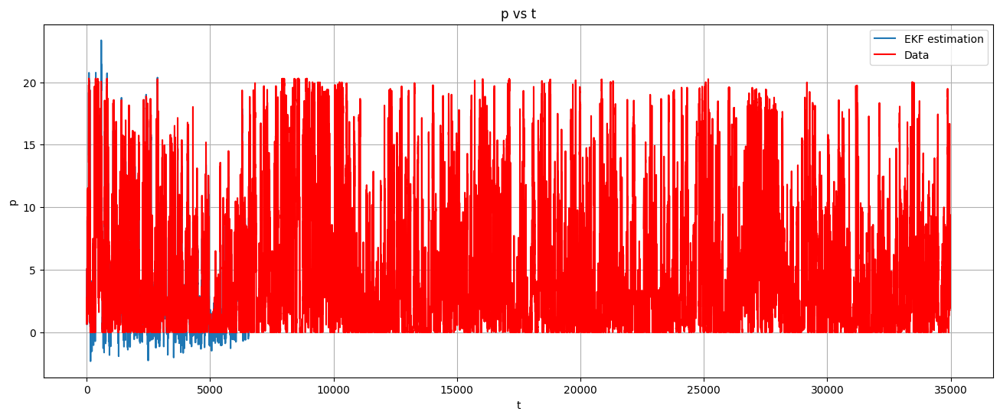

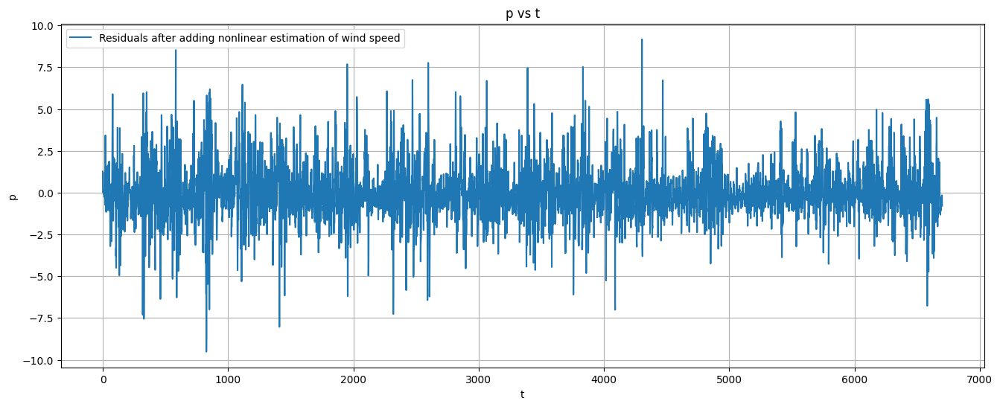

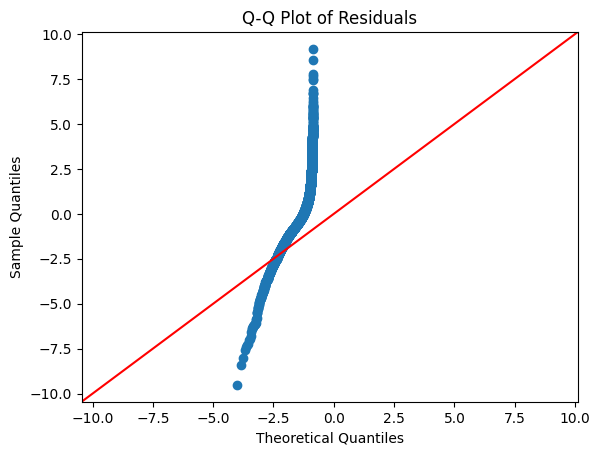

/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/2659997563.py:109: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


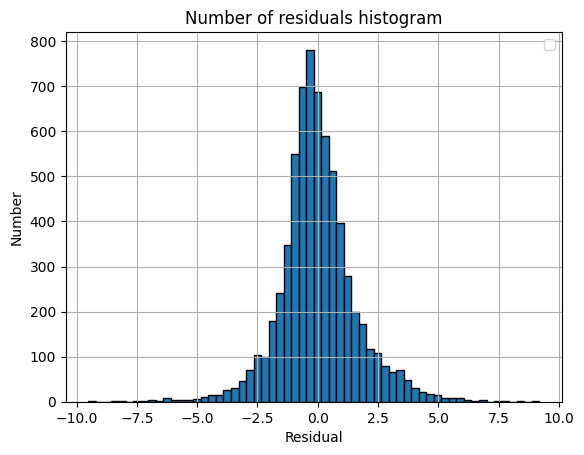

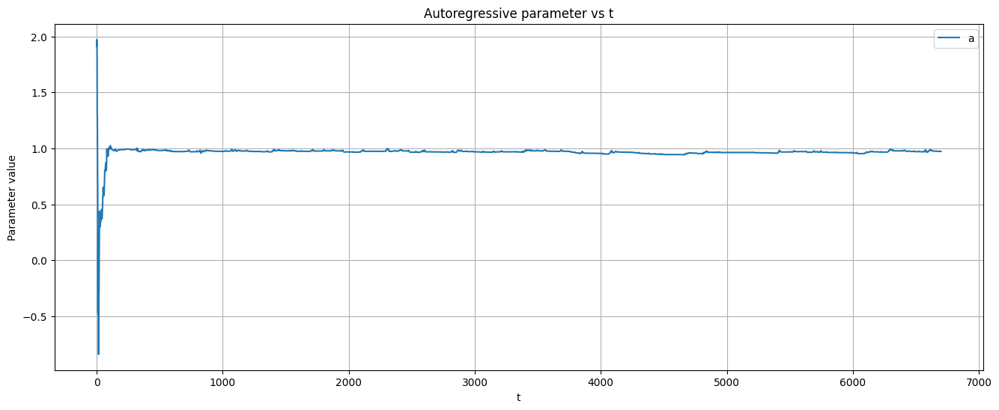

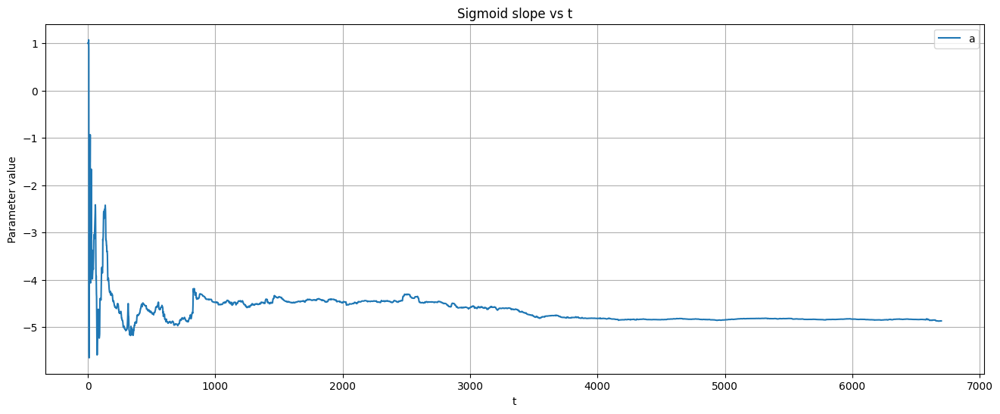

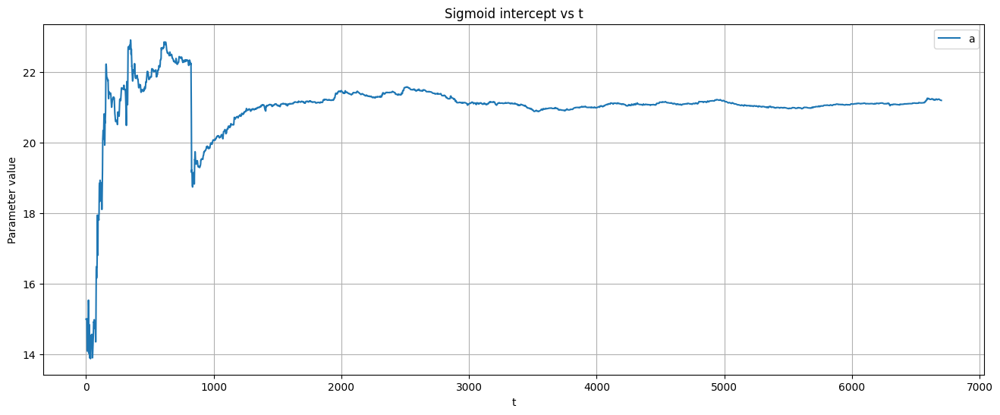

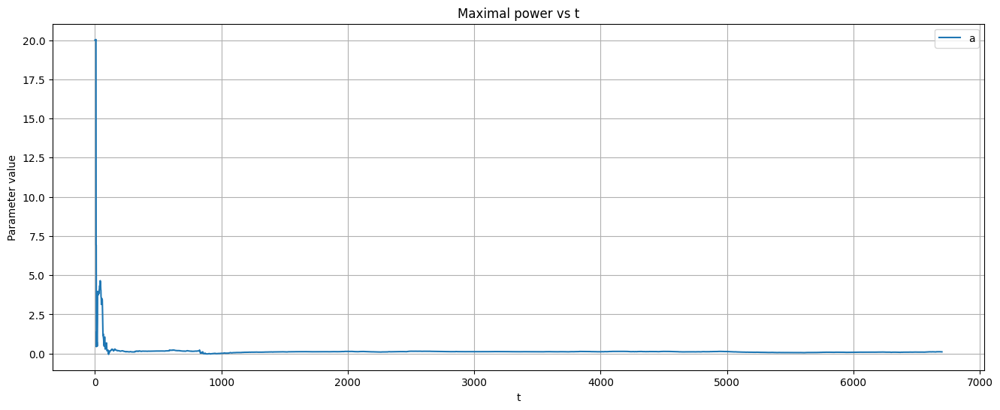

...

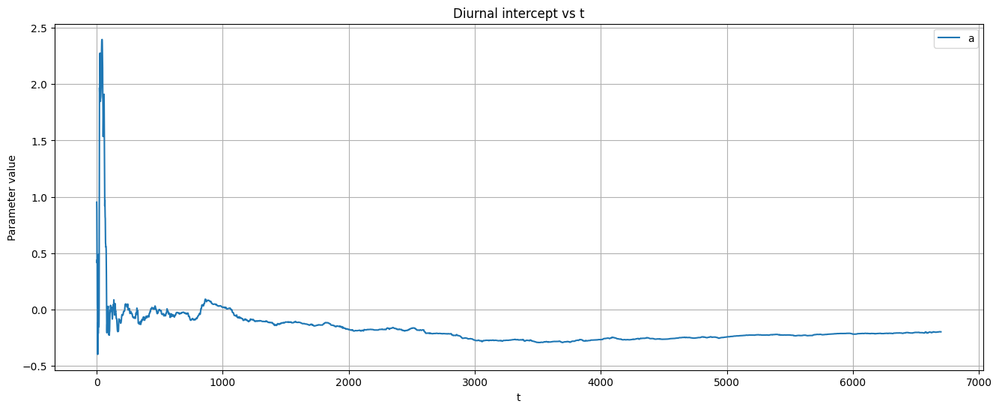

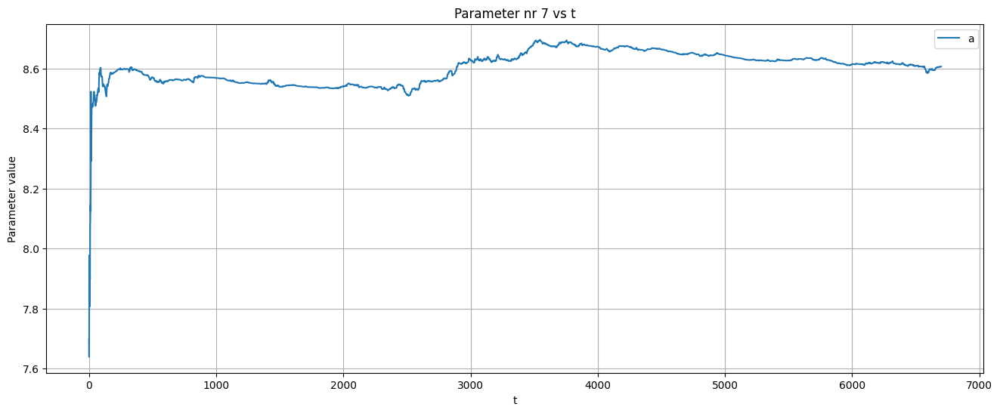

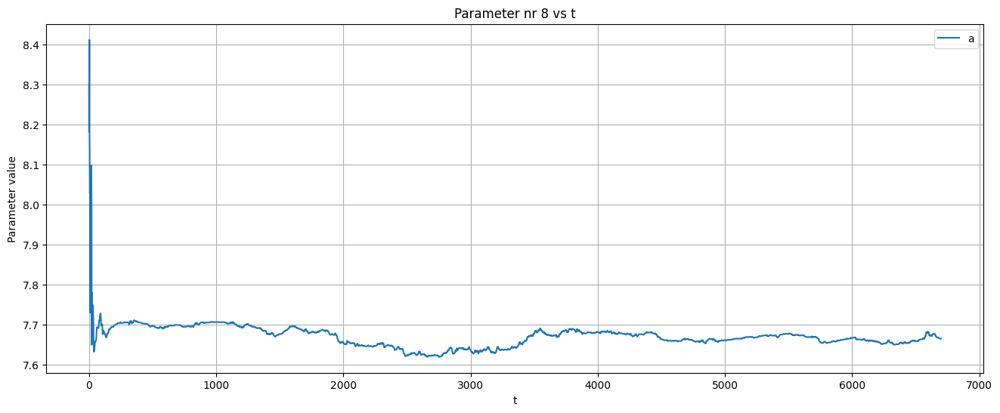

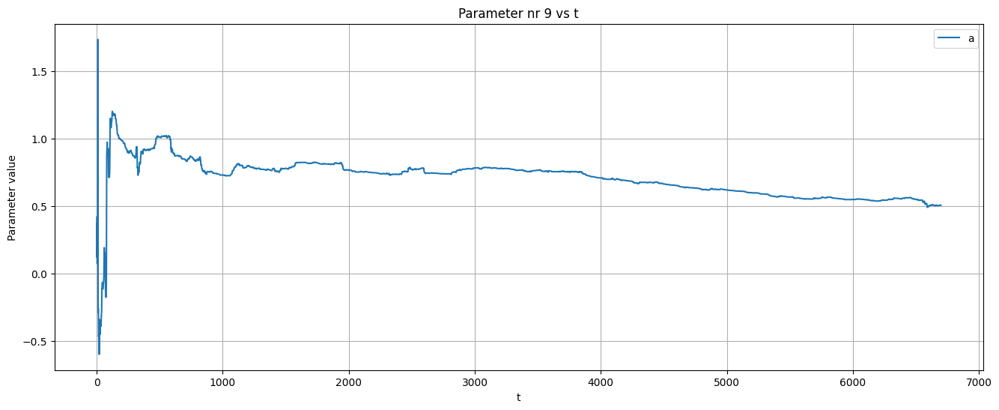

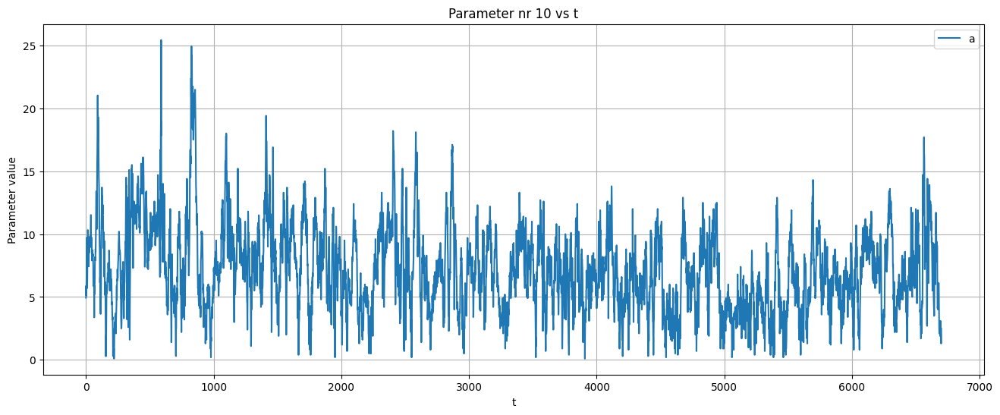

Final converged state (after 3000, before it goes to inf): [ 0.96798023 -4.59361596 21.09137067  0.11741497 -0.14861765 -0.27151396
  8.62862801  7.63656018  0.78167294  8.19997679]
The MSE of residuals are 2.3145382592276595


In [ ]:
def sigmoid(z):
    z = np.clip(z, -60, 60) # Irellevant?
    return 1 / (1 + np.exp(-z))

def f(X, Ws, Wd, tod, dt):
    p, a, b, c, p_max, d1, d2, T1, T2, ar_delta, Ws_lag_1 = X
    s = sigmoid(b * (Ws - c))
    return np.array([a * p + p_max * s + d1 * np.cos(2 * np.pi * (tod - T1)) + d2 * np.sin(2 * np.pi * (tod - T2)) + ar_delta * (Ws - Ws_lag_1), # We are assuming that there is a maximum of production that we can generate
                    a,
                    b, 
                    c, 
                    p_max, 
                    d1, 
                    d2, 
                    T1, 
                    T2,
                    ar_delta,
                    Ws
                    ], dtype=float)

def F(X, Ws, Wd, tod, dt):
    p, a, b, c, p_max, d1, d2, T1, T2, ar_delta, Ws_lag_1  = X
    s = sigmoid(b * (Ws - c))
    ds = s * (1 - s)
    J = np.eye(len(X))
    J[0,0] = a # + s
    J[0,1] = p
    J[0,2] = p_max *  ds * (Ws - c) # p * ds * (Ws - c)
    J[0,3] = p_max * ds * (-b)# p * ds * (-b)
    J[0,4] = s # Derivative of max that we can generate
    J[0,5] = np.cos(2 * np.pi * (tod - T1)) # Derivative of max that we can generate
    J[0,6] = np.sin(2 * np.pi * (tod - T2))
    J[0,7] = 2 * np.pi * d1 * np.sin(2 * np.pi * (tod - T1)) # Derivative of translation of the wave
    J[0,8] = - 2 * np.pi * d2 * np.cos(2 * np.pi * (tod - T2))
    J[0,9] = (Ws - Ws_lag_1)
    J[0,10] = - ar_delta
    return J

def h(X, Ws, Wd, tod, dt):
    return np.array([X[0]], dtype=float)

def H(X, Ws, Wd, tod, dt):
    _ = np.zeros((1, len(X)), dtype=float) # Make a throw away matrix
    _[0, 0] = 1
    return _

def ekf(y, Ws, Wd, tod, dt=1):

    # These two are the only ones that are changed
    X = np.array([y[0], 2, 1, 15, 20, 1, 1, 8, 8, 0.5, 3], dtype=float)
    Q = np.diag([1e-2, 1e-8, 1e-8, 1e-8, 1e-8, 1e-8, 1e-8, 1e-8, 1e-8, 1e-8, 1e-8])

    # Initializing
    R = np.array([[0.1]], dtype=float)
    P = np.eye(len(X)) * 10
    
    out = []
    for t in range(1, len(y)):
        Xp = f(X, Ws[t-1], Wd[t-1], tod[t-1], dt)
        Fk = F(X, Ws[t-1], Wd[t-1], tod[t-1], dt)
        Pp = Fk @ P @ Fk.T + Q # Q is the regularization of the EKF?
        yp = h(Xp, Ws[t], Wd[t], tod[t], dt) # Ws[t-1] or Ws[t]?
        Hk = H(Xp, Ws[t], Wd[t], tod[t], dt)
        r = np.array([y[t]], dtype=float) - yp
        S = Hk @ Pp @ Hk.T + R
        K = Pp @ Hk.T @ np.linalg.inv(S)
        X = Xp + (K @ r).reshape(-1)
        P = (np.eye(len(X)) - K @ Hk) @ Pp
        out.append(X.copy())
    return np.array(out)

X_t = ekf(y = data['p'].values, Ws = data['Ws1'].values, Wd = data['Ws1'].values, tod = data['tod'].values)


t = [t for t in range(len(X_t[:, 0]))]

# Plot parameter estimated 
plt.figure(figsize=(16, 6))
plt.plot(t, X_t[:, 0], label='EKF estimation')
plt.plot(t, data['p'].values[1 : ], label = 'Data', color = 'red')
plt.legend()
plt.xlabel('t')
plt.ylabel('p')
plt.title('p vs t')
plt.grid('on')
plt.show()

# Plot residuals
residuals = data['p'].values[1 : ] - X_t[:, 0]
residuals = np.insert(residuals, 0, data['p'].values[0])
data['residuals'] = residuals
plt.figure(figsize=(16, 6))
plt.plot([t for t in range(len(data['residuals']))], data['residuals'], label='Residuals after adding nonlinear estimation of wind speed')
plt.legend()
plt.xlabel('t')
plt.ylabel('p')
plt.title('p vs t')
plt.grid('on')
plt.show()

# Q-Q plot of residuals
sm.qqplot(data['residuals'], line='45')
plt.title("Q-Q Plot of Residuals")
plt.show()

# Histogram of residuals
plt.figure()
plt.hist(data['residuals'], bins = 60, edgecolor = "k")
plt.legend()
plt.xlabel('Residual')
plt.ylabel('Number')
plt.title('Number of residuals histogram')
plt.grid('on')
plt.show()

# # Plotting of parameters
parameter_names = ['Power', 'Autoregressive parameter', 'Sigmoid slope', 'Sigmoid intercept', 'Maximal power', 'Diurnal amplitude', 'Diurnal intercept']
for parameter in range(1, X_t.shape[1]):
    plt.figure(figsize=(16, 6))
    plt.plot(t, X_t[:, parameter], label = 'a')
    plt.legend()
    plt.xlabel('t')
    plt.ylabel('Parameter value')
    try:
        plt.title(f'{parameter_names[parameter]} vs t')
    except:
        plt.title(f'Parameter nr {parameter} vs t')
    plt.grid('on')
    plt.show()

# Plot the logistic function that we estimated


state_after_nr_of_iterations = 3000
nr_of_iterations_in_mean = 2000
print(f'Final converged state (after {state_after_nr_of_iterations}, before it goes to inf): {X_t[state_after_nr_of_iterations, 1 :]}')
print(f'The MSE of residuals are {1 / len(data['residuals'].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_of_iterations_in_mean]) * sum(data['residuals'].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_of_iterations_in_mean] ** 2)}')

# The MSE of residuals are 2.512637546439798

### Residual analysis - Investigation

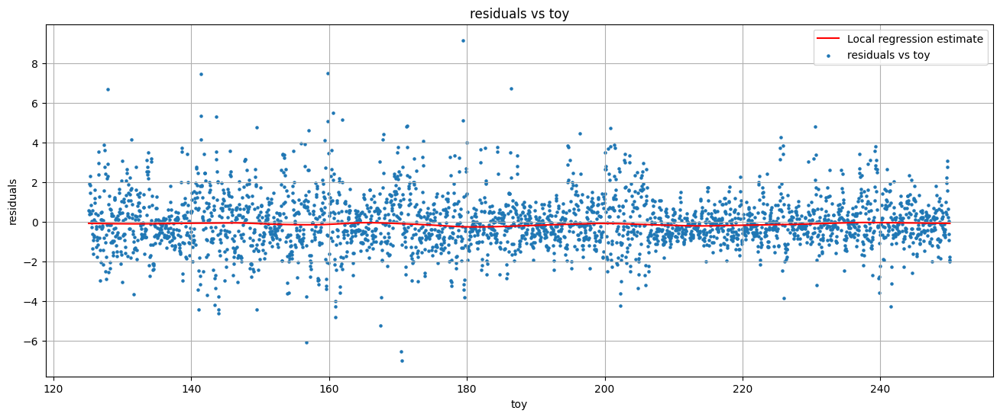

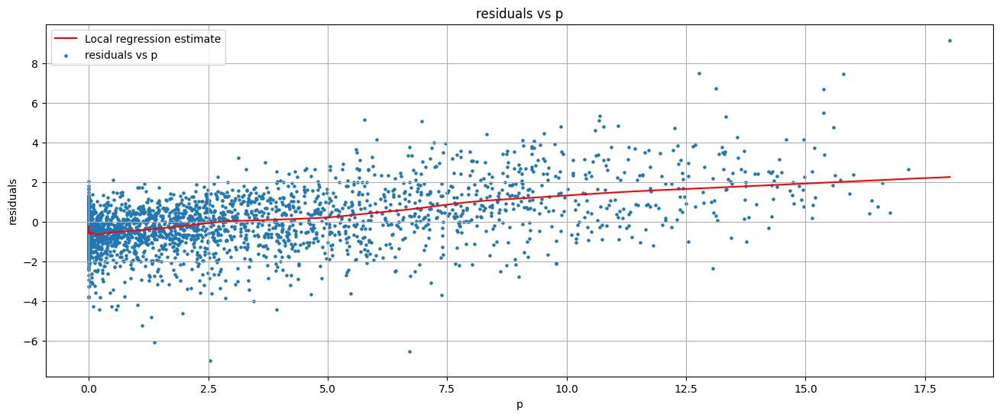

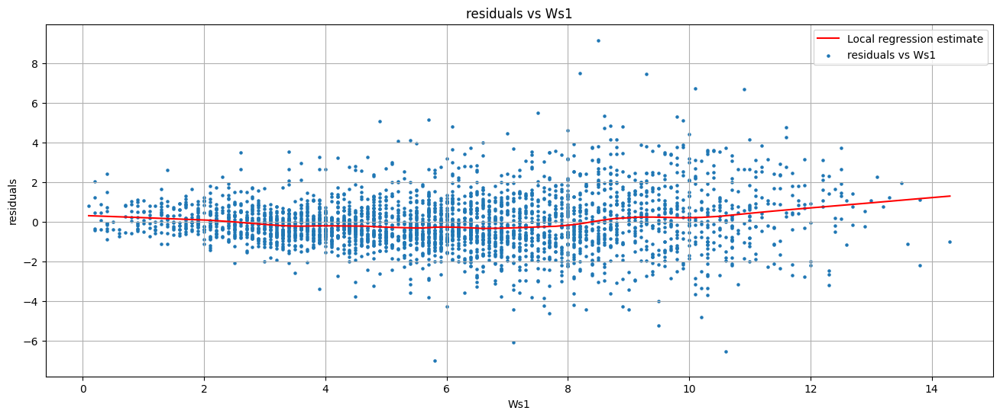

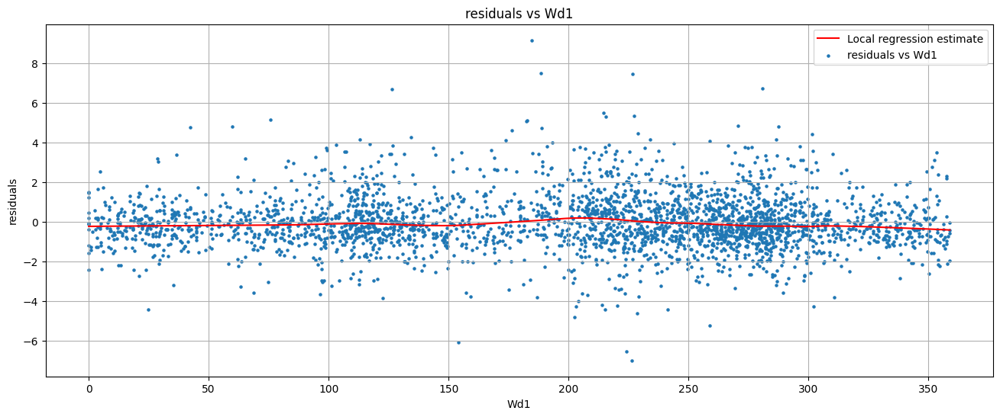

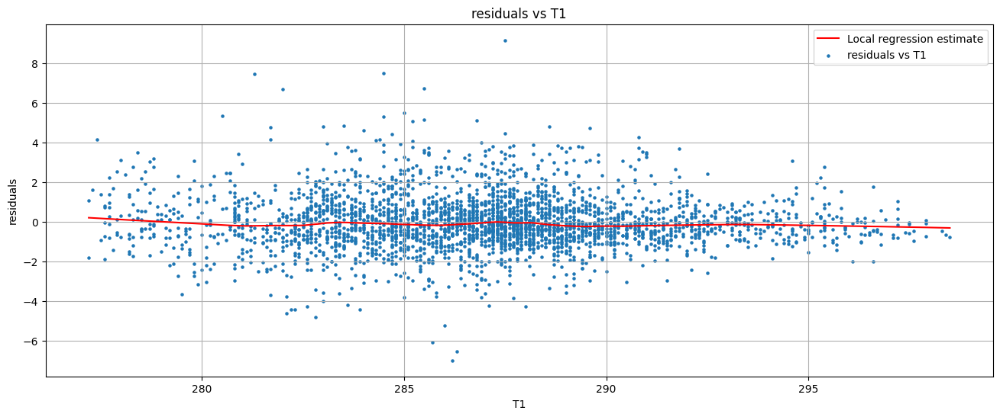

...

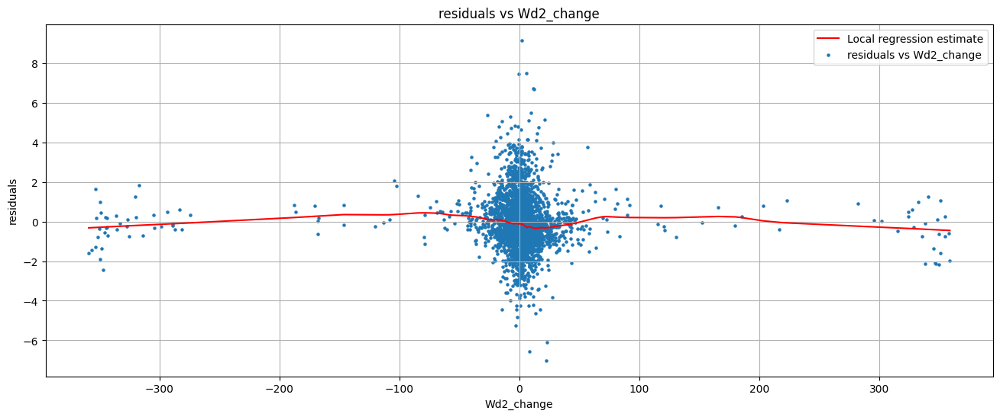

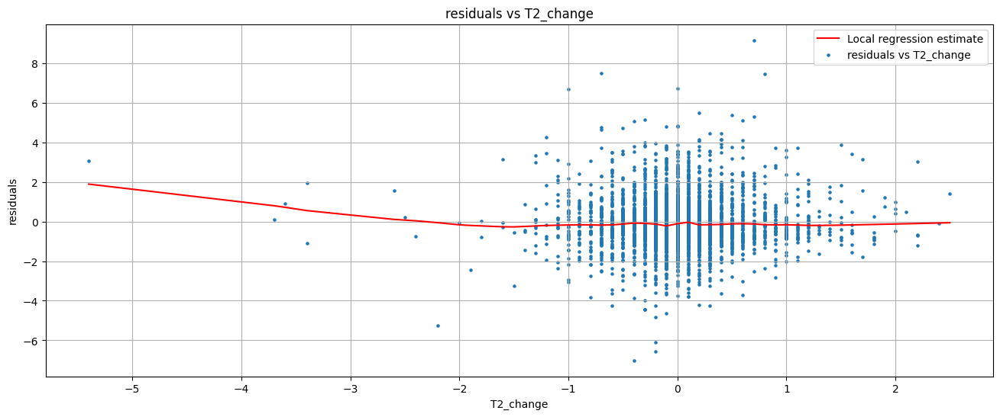

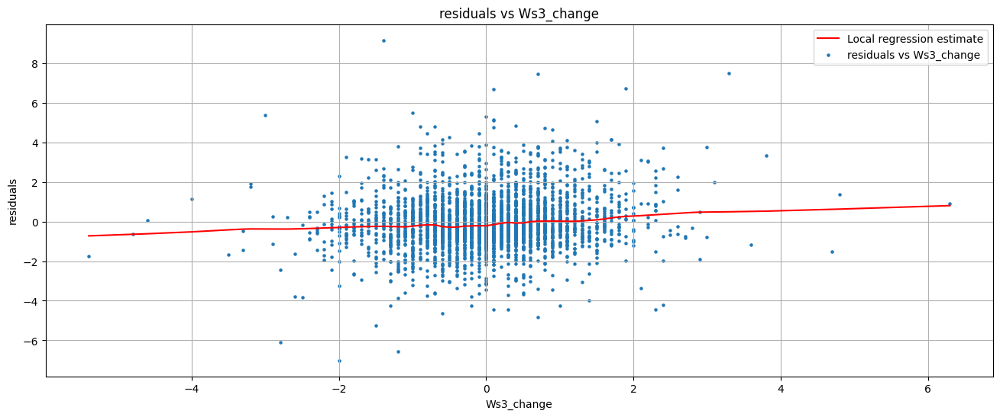

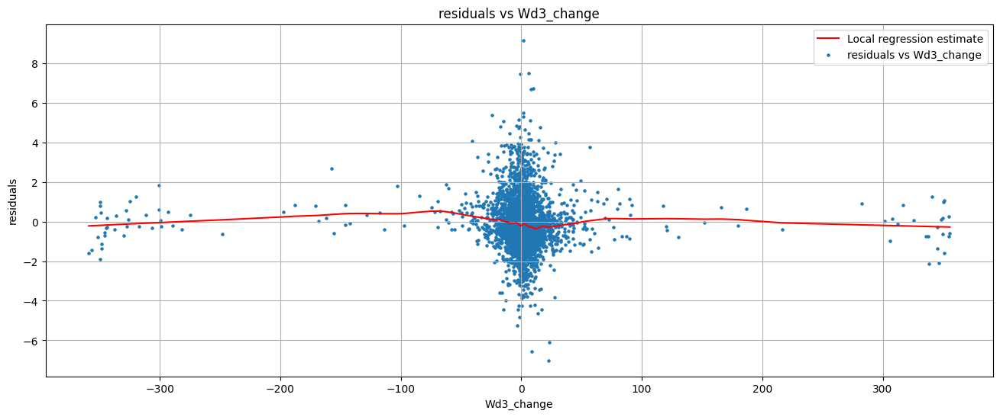

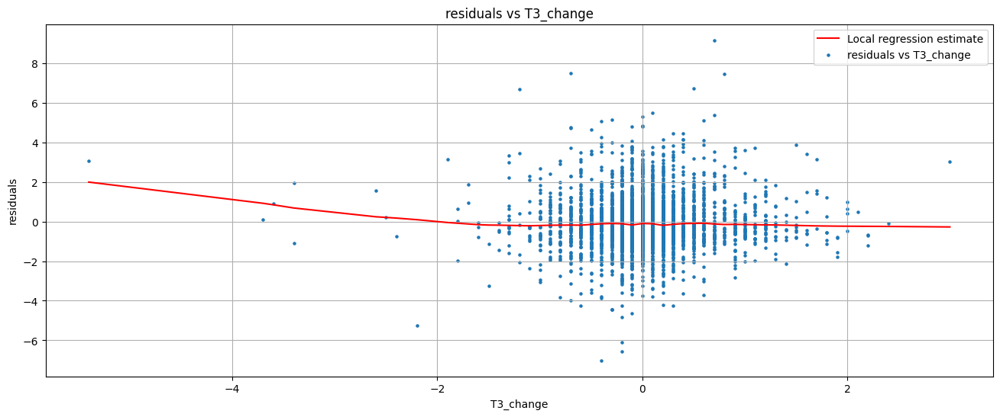

In [ ]:
def plot_residual(data, investigated_columns = [], regressor_column = 'Ws1_change', target_column = 'residuals', nr_data_points_in_analysis = 3000, frac = 0.2):
    if len(investigated_columns) == 0:
        plt.figure(figsize=(16, 6))
        residual_regression = lowess(data[target_column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], data[regressor_column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], frac = frac)
        regressor, regression_target = residual_regression.T[0], residual_regression.T[1]
        plt.plot(regressor, regression_target, color = 'red', label = 'Local regression estimate')
        plt.scatter(data[regressor_column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], data[target_column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], label = f'{target_column} vs {regressor_column}', s = 5)
        plt.legend()
        plt.xlabel(f'{regressor_column}')
        plt.ylabel(f'{target_column}')
        plt.title(f'{target_column} vs {regressor_column}')
        plt.grid('on')
        plt.show()
    
    else:
        for column in investigated_columns:
            plt.figure(figsize = (16, 6))
            residual_regression = lowess(data[target_column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], data[column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], frac = frac)
            regressor, regression_target = residual_regression.T[0], residual_regression.T[1]
            plt.plot(regressor, regression_target, color = 'red', label = 'Local regression estimate')
            plt.scatter(data[column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], data[target_column].values[state_after_nr_of_iterations : state_after_nr_of_iterations + nr_data_points_in_analysis], label = f'{target_column} vs {column}', s = 5)
            plt.legend()
            plt.xlabel(f'{column}')
            plt.ylabel(f'{target_column}')
            plt.title(f'{target_column} vs {column}')
            plt.grid('on')
            plt.show()


investigated_columns = ['toy', 'p', 'Ws1', 'Wd1', 'T1', 'Ws2', 'Wd2', 'T2', 'Ws3', 'Wd3',
       'T3', 'tod', 'Ws1_change', 'Wd1_change', 'T1_change',
       'Ws2_change', 'Wd2_change', 'T2_change', 'Ws3_change', 'Wd3_change',
       'T3_change']

plot_residual(data, investigated_columns = investigated_columns)

# The residuals are defined as p - estimation

# At high wind speeds and powers, we are underestimating the prediction


## Parameter estimation thorugh Monte Carlo simulation

- Due to bad convergence of parameters, the Monte Carlo method will be used to evaluate parameters

In [ ]:
# 
def model(data, a_interval, b_interval, c_interval, p_max_interval, d1_interval, d2_interval, T1_interval, T2_interval, nr_sim = 1, wind_speed_column = 'Ws1'):
    best_parameter_set = np.zeros(8) # 8 Parameters that we are trying to estimate
    best_MSE = 1e10
    
    a, b, c, p_max, d1, d2, T1, T2 = np.random.uniform(a_interval[0], a_interval[1]), np.random.uniform(b_interval[0], b_interval[1]), np.random.uniform(c_interval[0], c_interval[1]), np.random.uniform(p_max_interval[0], p_max_interval[1]), np.random.uniform(d1_interval[0], d1_interval[1]), np.random.uniform(d2_interval[0], d2_interval[1]), np.random.uniform(T1_interval[0], T1_interval[1]), np.random.uniform(T2_interval[0], T2_interval[1])
    for sim in range(nr_sim):
        p_sim = [data.iloc[0]['p']]
        for i in range(1, len(data)):
            p_sim.append(a * p_sim[-1] + p_max * sigmoid(-b * (data.iloc[i][wind_speed_column] - c)) + d1 * np.cos(2 * np.pi * (data.iloc[i]['tod'] - T1)) + d2 * np.sin(2 * np.pi * (data.iloc[i]['tod'] - T2)))
        MSE = np.mean((data['p'].values - p_sim) ** 2)
        print(f'The MSE is {MSE}')
        # Update if best
        if MSE < best_MSE:
            best_MSE = MSE
            best_parameter_set = [a, b, c, p_max, d1, d2, T1, T2]

    print(f'The best MSE is {best_MSE}')
    print(f'The best Parameter set is {best_parameter_set}')
    return best_parameter_set


# best_parameter_set = model(data,  a_interval = [0.5, 1.5], b_interval = [-1, 3], c_interval = [18, 23], p_max_interval = [1, 25],d1_interval = [-2, 2], d2_interval = [-2, 2], T1_interval = [7, 9], T2_interval = [7, 9],nr_sim = 10)

# TAKES A TON OF TIME TO RUN

The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The MSE is nan
The best MSE is 10000000000.0
The best Parameter set is [0. 0. 0. 0. 0. 0. 0. 0.]


/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/2207483524.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


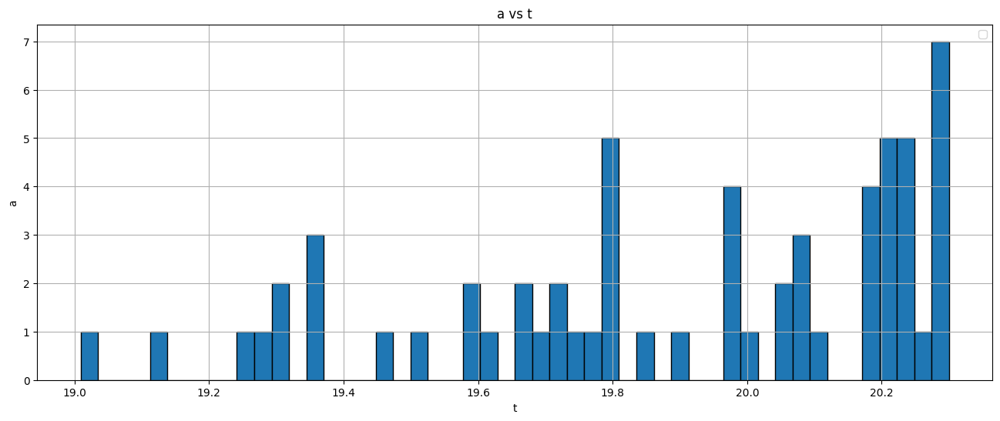

20.3
The correlation between Ws1 and p is for 0.785466587196933


/var/folders/cd/1fwmm66d22v8pfgmc2gdqz8m0000gn/T/ipykernel_1366/2207483524.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


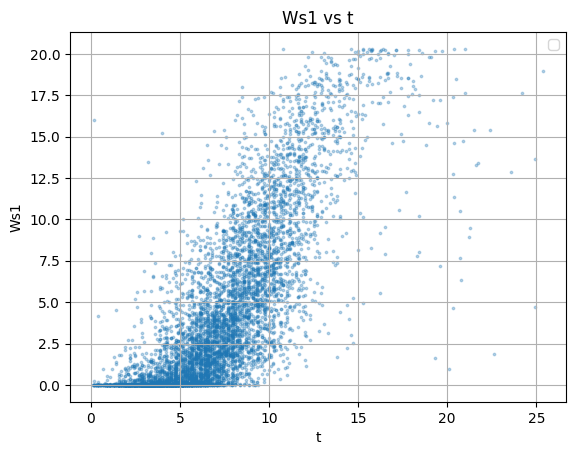

The correlation between Wd1 and p is for 0.15322965568064315


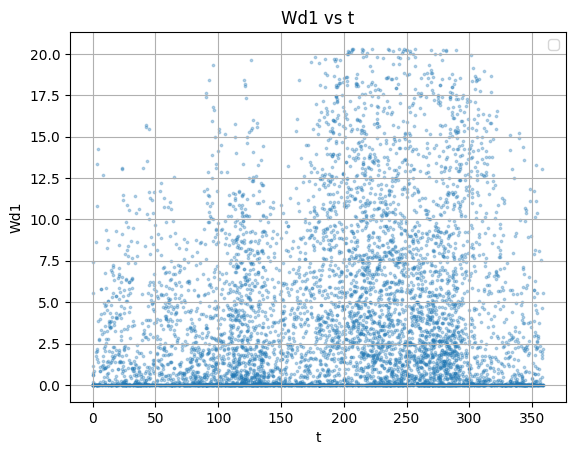

The correlation between T1 and p is for -0.22537258744892377


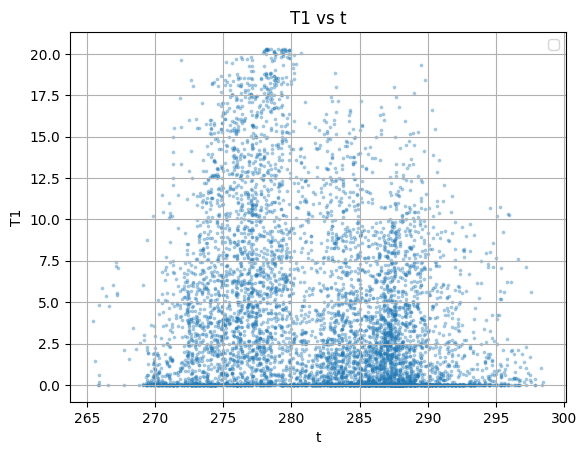

The correlation between Ws2 and p is for 0.7838157259038068


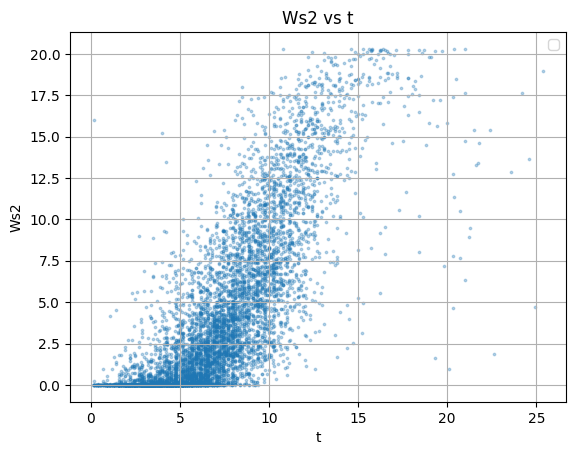

The correlation between Wd2 and p is for 0.15174632391618822


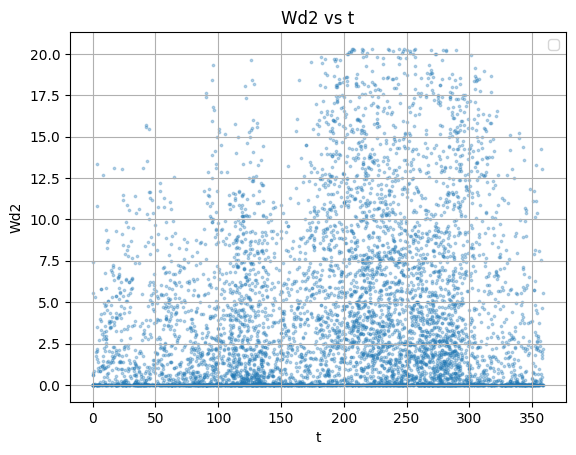

The correlation between T2 and p is for -0.22671064253125361


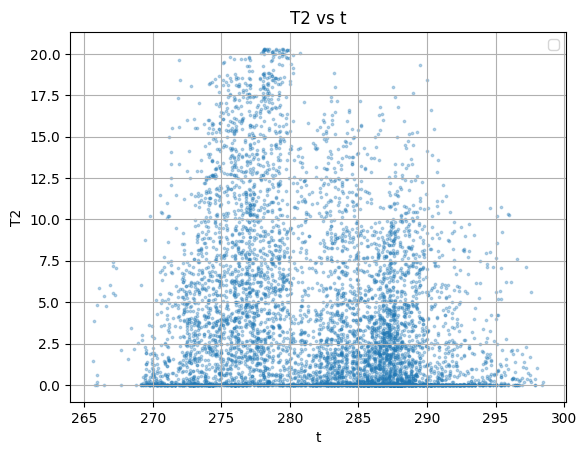

The correlation between Ws3 and p is for 0.7824650062337631


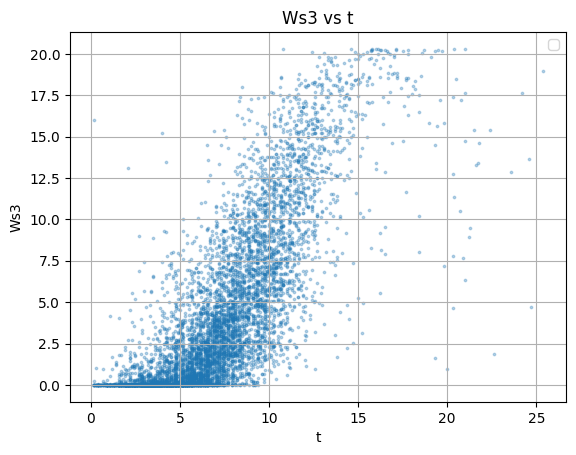

The correlation between Wd3 and p is for 0.1551041892273181


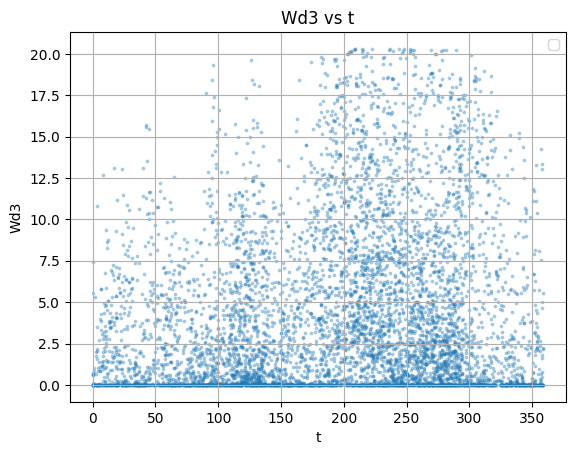

The correlation between T3 and p is for -0.22782776412891745


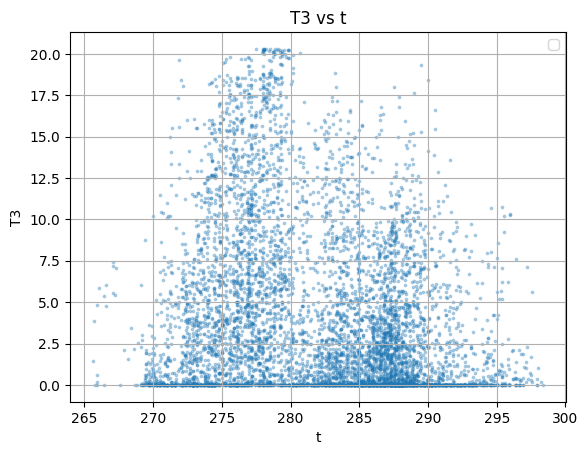

The correlation between p_change and p is for 0.16416916067547696


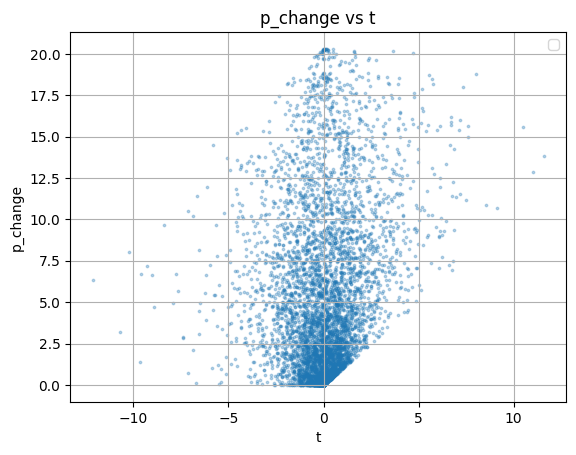

The correlation between Ws1_change and p is for 0.04046565334354889


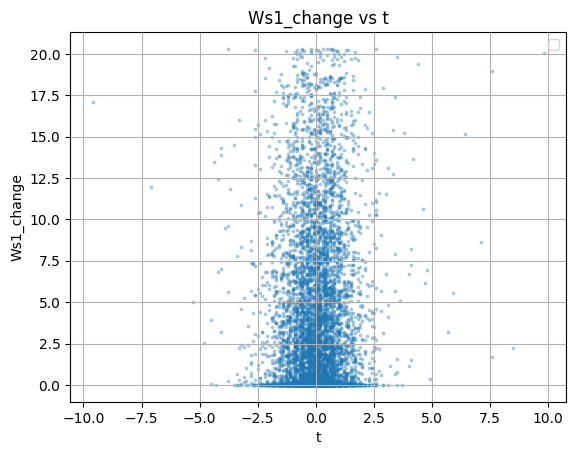

The correlation between Wd1_change and p is for 0.013468341300038754


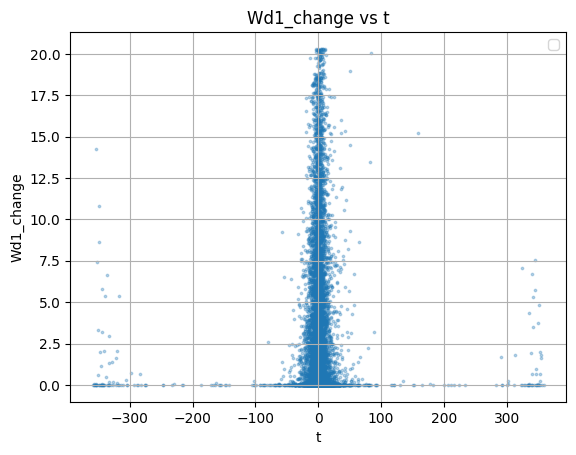

The correlation between T1_change and p is for 0.016587935175700837


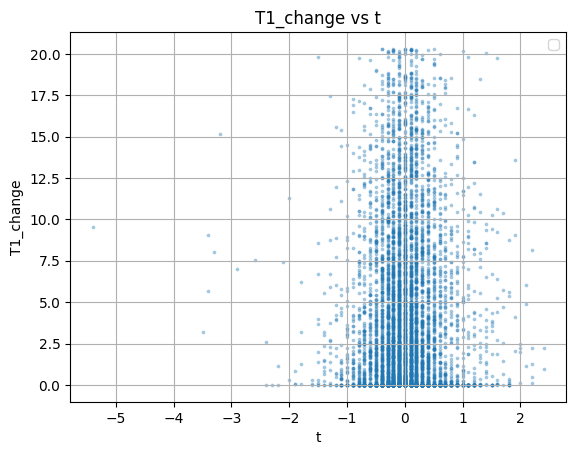

The correlation between Ws2_change and p is for 0.038972412534850835


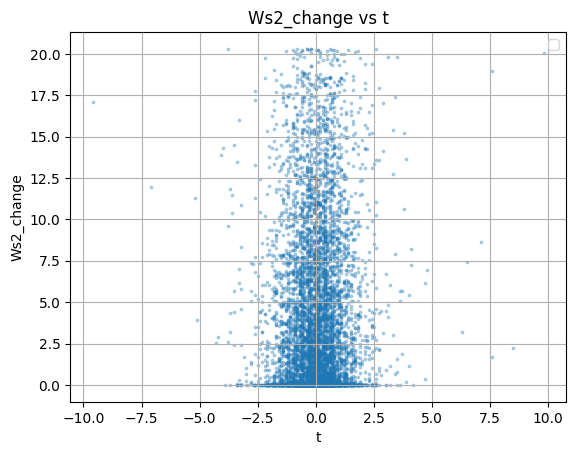

The correlation between Wd2_change and p is for 0.012492524981027637


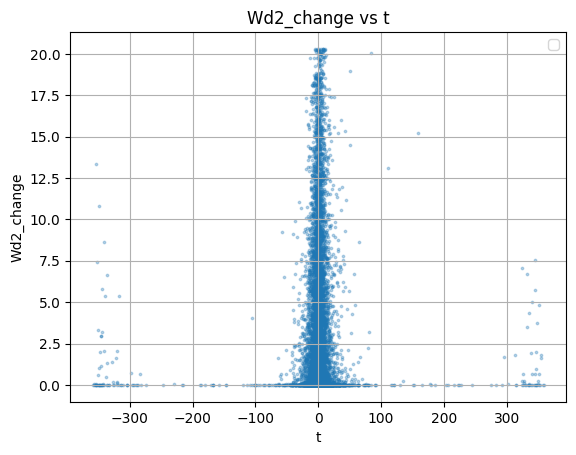

The correlation between T2_change and p is for 0.015983907758632315


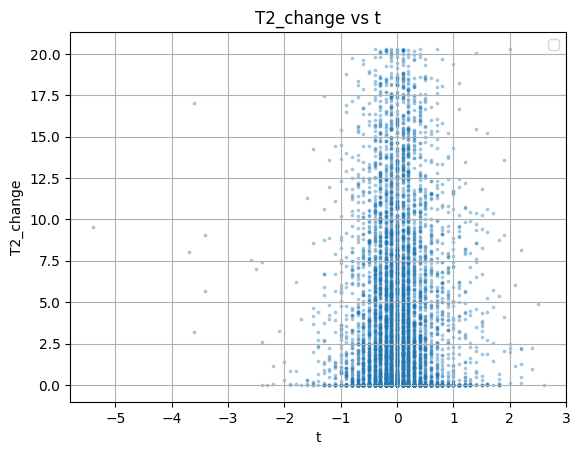

The correlation between Ws3_change and p is for 0.03683842234162839


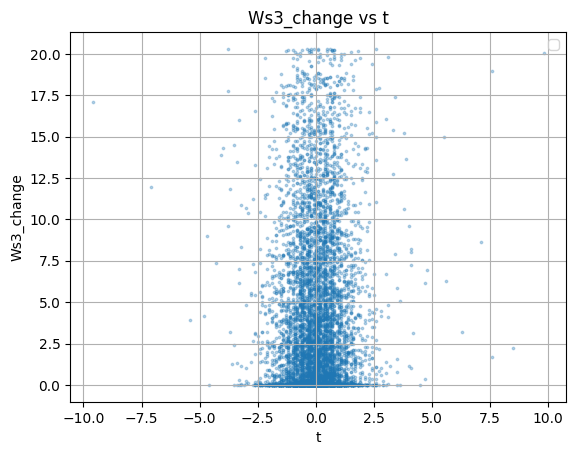

The correlation between Wd3_change and p is for 0.012665829410934647


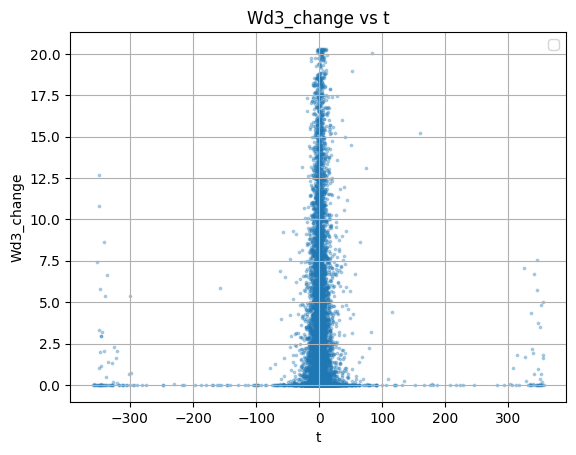

The correlation between T3_change and p is for 0.020006029171224113


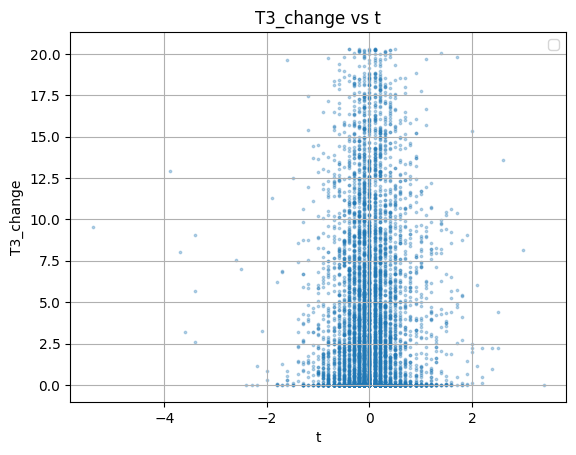

The maximum power is 20.3


np.float64(1.515)

In [ ]:
data = data.dropna()
# Histogram of p, seems like it is some kind of maximal production
plt.figure(figsize=(16, 6))
plt.hist(data[data['p'] > 19]['p'], bins = 50, edgecolor = "k")
plt.legend()
plt.xlabel('t')
plt.ylabel('a')
plt.title('a vs t')
plt.grid('on')
plt.show()
print(max(data['p'])) # The max is approximately 20.3, this will be the roof of the scaling curve

column_list = ['Ws1', 'Wd1', 'T1', 'Ws2', 'Wd2', 'T2', 'Ws3', 'Wd3',
       'T3', 'p_change', 'Ws1_change', 'Wd1_change', 'T1_change', 'Ws2_change',
       'Wd2_change', 'T2_change', 'Ws3_change', 'Wd3_change', 'T3_change']
for column in column_list:
    print(f'The correlation between {column} and p is for {np.corrcoef(data['p'], data[column])[0][1]}')
    plt.figure()
    plt.scatter(data[column], data['p'], s = 3, alpha = 0.3)
    plt.legend()
    plt.xlabel('t')
    plt.ylabel(f'{column}')
    plt.title(f'{column} vs t')
    plt.grid('on')
    plt.show()
print(f'The maximum power is {max(data['p'])}')

data.iloc[0]['p']

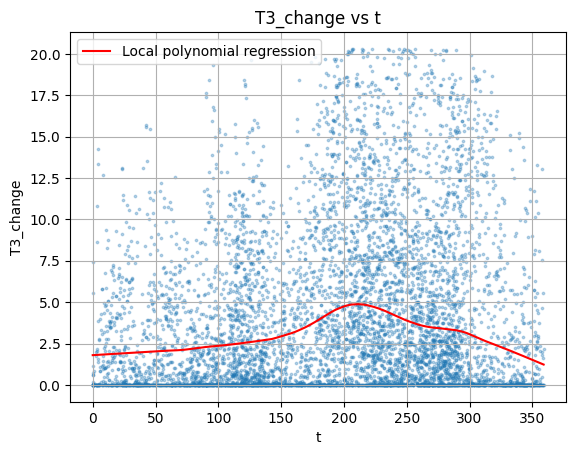

In [ ]:
regressor_column, target_column, frac = 'Wd1', 'p', 0.3
data = data.dropna()
regression = lowess(data[target_column], data[regressor_column], frac = frac)
y = [val for val in regression[:, 1]]
plt.figure()
plt.scatter(data['Wd1'], data['p'], s = 3, alpha = 0.3)
plt.plot(regression[:, 0], y, label = 'Local polynomial regression', color = 'red')
plt.legend()
plt.xlabel('t')
plt.ylabel(f'{column}')
plt.title(f'{column} vs t')
plt.grid('on')
plt.show()

# Some kind of parametrization for this?

### SDE model

# Ideas for full model

- Kernel regression over time of year and time of day for predicting wind speed
- Kernel regression of wind speed and 
- Autoregressive part, of 1, 2 and 3 hour forecast
- Derivative for decrease, check residuals to see how the SDE performs, use the R function
- Recursive least squares
- Euler maryama for SDE parameter estimation?
- Time adaptive quantile regression
- Regime modelling?
- Estimate the correlation matrix based on data, to model the three hour forecast densities (forecast of windspeed or $\textbf{power}$?)
- Model wind speed, keep in as a second model in the system, or based on data just (in the framework they try to model it)?
- Split training and test data
- For diurnal motions, introduce sinusoidals into SDE, with period 24h, other correlation is dealt with by $U_t$

#### Final thought
- Dependence 
- Yearly dependence
- Teperature dependence
- Changes in wind speed
- Diurnal
- Temperature (model changes)
- Autoregressive
- SDE
- Estimation of power curve

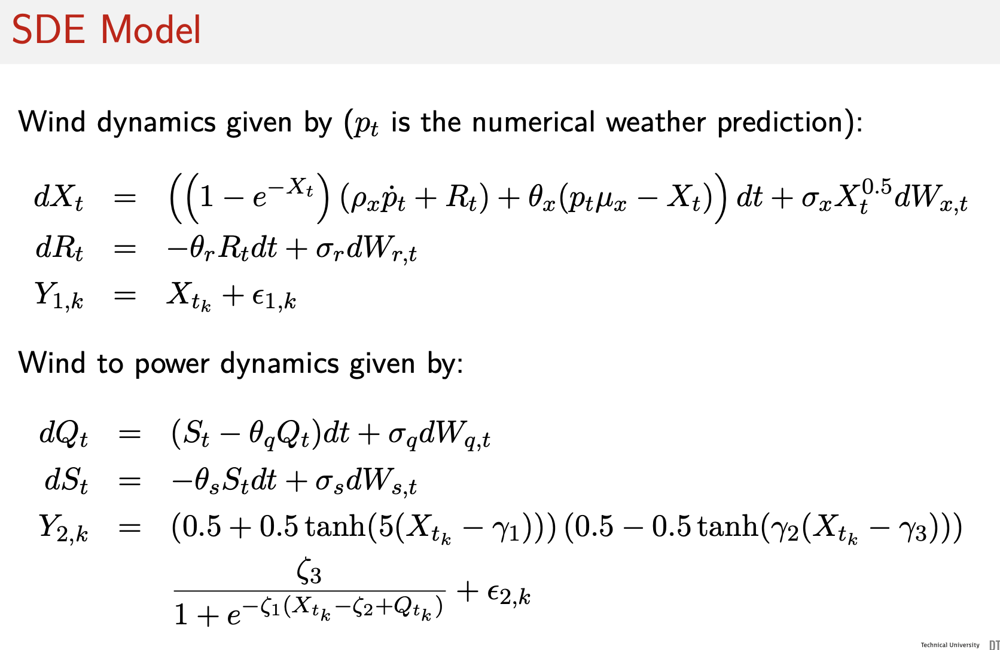

#### Wind speed model

$dx_t = \Big( \theta_1 \cdot (\mu_x \mathrm{NWP}_t - x_t)+ \big( \alpha_x \sin\!\left( \frac{2\pi}{24} t + \phi_x \right)+ U_t + \rho_x \mathrm{NWP}_t \big)\Big)(1 - e^{-x_t})\, dt + \sigma \cdot x_t^{\gamma} \cdot dw_t$

$dU_t = \theta_u (\mu_u - U_t)\, dt + \sigma_u\, dw_t$

$y_k = x_{t_k} + \epsilon_k, \qquad \epsilon_k \sim N(0, s^2)$


## Additional optional ideas:

- Reconciled forecast, annual variations, multiple forecasts added
- Variogram as scoring method as scoring function instead of log likelihood for multivariate forecasts?

##### Møllers formula:

- $
\mathrm{d}Y_t
= -\theta\!\left( Y_t - \tilde{p}_t - c\,\tilde{p}_t(1-\tilde{p}_t)(1 - 2Y_t ) \right)\mathrm{d}t
\;+\; 2\sqrt{\theta \alpha\, \tilde{p}_t(1-\tilde{p}_t)}\,\mathrm{d}W_t.
$

In [ ]:
# Save back the data
print(data.columns)
# Cleaning for the R script
data['time_and_date'] = data['t']
data['y'] = data['p']
data['t'] = pd.Series([i for i in range(len(data))])
data = data.drop(['v_bin', 'd_bin'], axis = 'columns')
data.to_csv('/Users/loveredin/Documents/GitHub/02427_advanced_time_series_analysis/02427_assignment_4/data/cex4_cleaned_data.csv')


Index(['t', 'toy', 'p', 'Ws1', 'Wd1', 'T1', 'Ws2', 'Wd2', 'T2', 'Ws3', 'Wd3',
       'T3', 'tod', 'p_change', 'Ws1_change', 'Wd1_change', 'T1_change',
       'Ws2_change', 'Wd2_change', 'T2_change', 'Ws3_change', 'Wd3_change',
       'T3_change', 'v_bin', 'd_bin', 'residuals'],
      dtype='object')


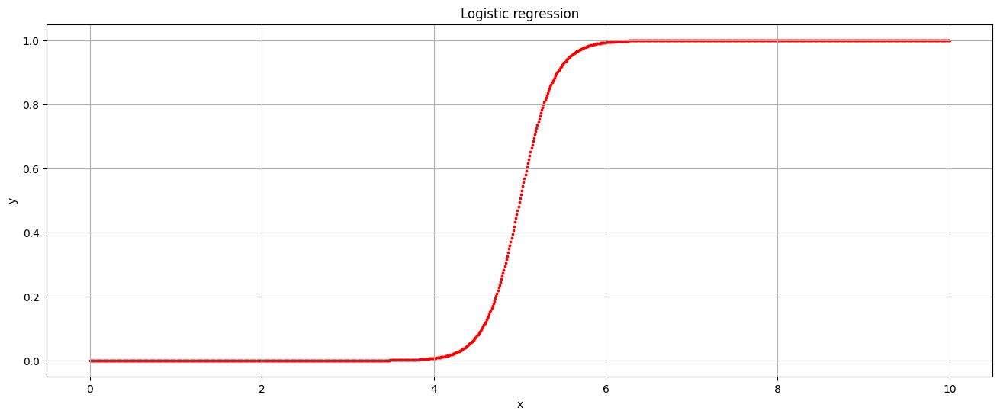

In [ ]:
def logistic_function(x, alpha, beta):
    return 1 / (1 + np.exp(-alpha * (x - beta)))

def plot_logistic(lower, upper, alpha, beta, nr_points = 1000):
    X = np.linspace(lower, upper, nr_points)
    y = []
    for x in X:
        y.append(logistic_function(x, alpha, beta))
    
    plt.figure(figsize = (16, 6))
    plt.scatter(X, y, color = 'red', s = 3)
    plt.title(f'Logistic regression')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.grid('on')
    plt.show()


alpha, beta = 5, 5
lower, upper = 0, 2 * beta
plot_logistic(lower, upper, alpha, beta)

## Full model, definition of all the thoughts:


#### Wind speed and wind direction
- The power curve yields the 
- Dependence on wind speed and and wind direction.
- The change yields the change in power production (SDE?)
- Estimate it by parametrize or kernel?

#### Diurnal variations
- Will have a dependence on when during the day it is

